# DATA9910 Assignment 2 <a class="anchor" id="top"></a>

**Simon Hall (D21125776)**

In this project, I will analyse data relating to COVID-19 in Ireland, using daily figures released by the Health Service Executive (HSE) and by the Health Protection Surveillance Centre (HPSC). The statistical information is taken largely from the Computerised Infectious Disease Reporting (CIDR) system, an interface developed to manage the surveillance and control of infectious diseases in Ireland. 

## Contents:
* [1. Importation and Description](#first-bullet)
* [2. Features](#second-bullet)
* [3. Caveats with the Data](#third-bullet)
* [4. Missing Values](#fourth-bullet)
* [5. Feature Reduction](#fifth-bullet)
* [6. Data Types](#sixth-bullet)
* [7. Data Preparation](#seventh-bullet)
* [8. Analysis and Visualisation](#eighth-bullet)
    - [Primary Metrics](#primary)
        * [i. Confirmed Cases](#cases-bullet)
        * [ii. Deaths](#deaths-bullet)
    - [Secondary Statistics](#secondary)
        * [iii. Hospitalisations](#hospital-bullet)
        * [iv. ICU Admissions](#icu-bullet)
        * [v. Cases: Healthcare Workers](#hcw-bullet)
        * [vi. Cases: Age Profile](#age-bullet)
        * [vii. Cases: Men vs Women](#sex-bullet)
* [9. Comparison: Cases, Hospitalisations, ICU, and Deaths](#ninth-bullet)
* [10. Excess Deaths from RIP.ie and the CSO](#tenth-bullet)
* [Conclusion](#eleventh-bullet)

## 1. Importation and Description <a class="anchor" id="first-bullet"></a>

[TOP ↑](#top)

First, we must load the relevant data, taken from [data.gov.ie](https://data.gov.ie/dataset/covid-19-hpsc-detailed-statistics-profile/resource/ce8d4c74-da75-4afe-8d58-fd125e4b7330). The grain of the data set is *per day*. The information relates to the COVID-19 pandemic, and includes the number of confirmed cases and confirmed deaths in the state, the primary metrics, as well as cumulative hospital admissions, cumulative ICU numbers, and cumulative cases among healthcare workers. The records go back to the beginning of the pandemic in Ireland, with the first confirmed case on 29th February, 2020.

In [1]:
if (!require('readr')) install.packages('readr')
library(readr)
covid <- readr::read_csv('COVID17.csv')

Loading required package: readr

Rows: 655 Columns: 41

── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): Date, StatisticsProfileDate
dbl (39): X, Y, ConfirmedCovidCases, TotalConfirmedCovidCases, ConfirmedCovi...


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



We can inspect the data to gauge its shape. We can see, for example, that there are 41 features and 637 individual records.

In [2]:
ncol(covid)
nrow(covid)

[1] 41

[1] 655

We can use the *str()* function to provide a little more information. We can see, for example, that two of the imported features have been assigned a character type despite being dates, while the remaining features have all been assigned double precision floating point types despite being mainly integers. We will alter these data types shortly.

In [3]:
str(covid)

spec_tbl_df [655 × 41] (S3: spec_tbl_df/tbl_df/tbl/data.frame)
 $ X                          : num [1:655] -856336 -856336 -856336 -856336 -856336 ...
 $ Y                          : num [1:655] 7036492 7036492 7036492 7036492 7036492 ...
 $ Date                       : chr [1:655] "2020/02/29 00:00:00+00" "2020/03/03 00:00:00+00" "2020/03/04 00:00:00+00" "2020/03/05 00:00:00+00" ...
 $ ConfirmedCovidCases        : num [1:655] 1 1 4 7 5 1 2 3 10 9 ...
 $ TotalConfirmedCovidCases   : num [1:655] 1 2 6 13 18 19 21 24 34 43 ...
 $ ConfirmedCovidDeaths       : num [1:655] 0 0 0 0 0 0 0 0 0 1 ...
 $ TotalCovidDeaths           : num [1:655] 0 0 0 0 0 0 0 0 0 1 ...
 $ StatisticsProfileDate      : chr [1:655] "2020/02/27 00:00:00+00" "2020/03/01 00:00:00+00" "2020/03/02 00:00:00+00" "2020/03/03 00:00:00+00" ...
 $ CovidCasesConfirmed        : num [1:655] NA NA 1 2 5 8 13 16 18 25 ...
 $ HospitalisedCovidCases     : num [1:655] NA NA 0 1 4 7 9 11 13 18 ...
 $ RequiringICUCovidCases     : num [1

Next, we can call the *summary()* function to get some descriptive statistics, though since this data contains mainly cumulative data, the means and quartiles will be of little use. Thankfully, it also provides us with the minimum, maximum, and number of missing values.

In [4]:
summary(covid)

       X                 Y               Date           ConfirmedCovidCases
 Min.   :-856336   Min.   :7036492   Length:655         Min.   :   1.0     
 1st Qu.:-856336   1st Qu.:7036492   Class :character   1st Qu.: 238.0     
 Median :-856336   Median :7036492   Mode  :character   Median : 456.0     
 Mean   :-856336   Mean   :7036492                      Mean   : 983.4     
 3rd Qu.:-856336   3rd Qu.:7036492                      3rd Qu.:1279.5     
 Max.   :-856336   Max.   :7036492                      Max.   :8248.0     
                                                                           
 TotalConfirmedCovidCases ConfirmedCovidDeaths TotalCovidDeaths
 Min.   :     1           Min.   :  0.00       Min.   :   0    
 1st Qu.: 26884           1st Qu.:  0.75       1st Qu.:1774    
 Median :186184           Median :  4.00       Median :2947    
 Mean   :182308           Mean   : 11.69       Mean   :3254    
 3rd Qu.:274840           3rd Qu.: 14.00       3rd Qu.:5000    
 Max.   

Next, we can take a look at the beginning and end of the data. We can see, for example, that some values (for example in CovidCasesConfirmed and HospitalisedCovidCases) which were blank in the original data set have been imported correctly as being missing, or NA.

In [5]:
head(covid)
tail(covid)

X,Y,Date,ConfirmedCovidCases,TotalConfirmedCovidCases,ConfirmedCovidDeaths,TotalCovidDeaths,StatisticsProfileDate,CovidCasesConfirmed,HospitalisedCovidCases,⋯,CommunityTransmission,CloseContact,TravelAbroad,FID,HospitalisedAged65to74,HospitalisedAged75to84,HospitalisedAged85up,Aged65to74,Aged75to84,Aged85up
<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
-856335.9,7036492,2020/02/29 00:00:00+00,1,1,0,0,2020/02/27 00:00:00+00,NA,NA,⋯,0,0,0,1,NA,NA,NA,NA,NA,NA
-856335.9,7036492,2020/03/03 00:00:00+00,1,2,0,0,2020/03/01 00:00:00+00,NA,NA,⋯,0,0,0,2,NA,NA,NA,NA,NA,NA
-856335.9,7036492,2020/03/04 00:00:00+00,4,6,0,0,2020/03/02 00:00:00+00,1,0,⋯,0,0,0,3,0,0,0,0,0,0
-856335.9,7036492,2020/03/05 00:00:00+00,7,13,0,0,2020/03/03 00:00:00+00,2,1,⋯,0,0,0,4,0,0,0,0,0,0
-856335.9,7036492,2020/03/06 00:00:00+00,5,18,0,0,2020/03/04 00:00:00+00,5,4,⋯,0,0,0,5,0,0,0,0,0,0
-856335.9,7036492,2020/03/07 00:00:00+00,1,19,0,0,2020/03/05 00:00:00+00,8,7,⋯,0,0,0,6,0,0,0,0,0,0


X,Y,Date,ConfirmedCovidCases,TotalConfirmedCovidCases,ConfirmedCovidDeaths,TotalCovidDeaths,StatisticsProfileDate,CovidCasesConfirmed,HospitalisedCovidCases,⋯,CommunityTransmission,CloseContact,TravelAbroad,FID,HospitalisedAged65to74,HospitalisedAged75to84,HospitalisedAged85up,Aged65to74,Aged75to84,Aged85up
<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
-856335.9,7036492,2021/12/11 00:00:00+00,4004,618956,NA,5788,2021/12/09 00:00:00+00,614929,21081,⋯,0,0,0,650,3596,4153,2628,31003,16481,9861
-856335.9,7036492,2021/12/12 00:00:00+00,4667,623618,NA,5788,2021/12/10 00:00:00+00,618931,21117,⋯,0,0,0,651,3601,4159,2630,31121,16506,9875
-856335.9,7036492,2021/12/13 00:00:00+00,4688,628306,NA,5788,2021/12/11 00:00:00+00,623596,21127,⋯,0,0,0,652,3601,4160,2631,31254,16540,9889
-856335.9,7036492,2021/12/14 00:00:00+00,3887,632177,NA,5788,2021/12/12 00:00:00+00,628278,21133,⋯,0,0,0,653,3603,4160,2632,31416,16568,9900
-856335.9,7036492,2021/12/15 00:00:00+00,4235,636407,47,5835,2021/12/13 00:00:00+00,632164,21188,⋯,0,0,0,654,3612,4165,2640,31563,16599,9916
-856335.9,7036492,2021/12/16 00:00:00+00,4141,640548,NA,5835,2021/12/14 00:00:00+00,636399,21235,⋯,0,0,0,655,3617,4170,2644,31679,16634,9930


Finally, for this initial phase, we can check to see of there were any problems during importation. Thankfully, the data seems to have imported smoothly.

In [6]:
problems(covid)

row,col,expected,actual,file
<int>,<int>,<chr>,<chr>,<chr>


## 2. Features <a class="anchor" id="second-bullet"></a>

[TOP ↑](#top)

There are forty-one features in total. The data types indicated below are taken directly from the data providers. The descriptions of each feature were not made very clear from the source, so these were researched and inferred from the data, where possible. In general, the original data is not well organised. The features, as presented, are in the order in which they appear in the data set.

### i. The Mystery of X and Y

In spite of serious, panicked efforts to unearth the significance of these two features, the precise meaning of X and Y remains elusive. However, they do not vary at all and are therefore useless for our purposes.

| Variable | Data Type | Description |
| :--- | :--- | :--- |
| X | numeric | Always -856335.869598. |
| Y | numeric | Always 7036492.39572. |

### ii. The Primary Metrics

The next five features are the most important. These numbers extend uninterrupted all the way back to 29th February, 2020, and are updated continuously on a daily basis, with the latest record reporting the counts recorded at 1pm that same day. The first feature is the primary date, and the next five features are the most important in the data set: daily ConfirmedCovidCases, cumulative TotalConfirmedCovidCases, daily ConfirmedCovidDeaths, and cumulative TotalCovidDeaths. I will refer to these as the **primary metrics**. The primary date applies to these primary metrics.

| Variable | Data Type | Description |
| :--- | :--- | :--- |
| Date | date | The primary date. |
| ConfirmedCovidCases (CCC) | numeric | The primary metric for confirmed cases. |
| TotalConfirmedCovidCases (TCCC) | numeric | A cumulative tally based on CCC. |
| ConfirmedCovidDeaths (CCD) | numeric | The primary metric for confirmed deaths. |
| TotalCovidDeaths (TCD) | numeric | A cumulative tally based on CCD. |

### iii. DSP Statistics

The remaining features are statistics generated by the Health Protection Surveillance Centre (HPSC). These are part of a Daily Statistics Profile (DSP) of COVID-19, an analysis that utilises data from two days previous, and available no later than 12am on that day. The StatisticsProfileDate refers back to this two day old data. These statistics are used by the experts and authorities to help identify patterns and trends. All the remaining features are based on this StatisticsProfileDate. FID is a column containing the unique row indentifier.

| Variable | Data Type | Description |
| :--- | :--- | :--- |
| StatisticsProfileDate | date | Relates to data from two days prior to the primary date.|
| CovidCasesConfirmed | numeric | A cumulative tally of cases, two days old. |
| HospitalisedCovidCases | numeric | A cumulative tally of hospitalisations, two days old. |
| RequiringICUCovidCases | numeric | A cumulative tally of ICU admissions, two days old. |
| HealthcareWorkersCovidCases | numeric | A cumulative tally of cases among healthcare workers, two days old. |
| Clusters Notified | numeric | A cumulative tally of clusters notified. |
| HospitalisedAged5 | numeric | A cumulative tally of those hospitalised aged 5 and under. |
| HospitalisedAged5to14 | numeric | A cumulative tally of those hospitalised aged 5 to 14. |
| HospitalisedAged15to24 | numeric | A cumulative tally of those hospitalised aged 15 to 24. |
| HospitalisedAged25to34 | numeric | A cumulative tally of those hospitalised aged 25 to 34. |
| HospitalisedAged35to44 | numeric | A cumulative tally of those hospitalised aged 35 to 44. |
| HospitalisedAged45to54 | numeric | A cumulative tally of those hospitalised aged 45 to 54. |
| HospitalisedAged55to64 | numeric | A cumulative tally of those hospitalised aged 55 to 64. |
| Male | numeric | A cumulative tally of males with confirmed COVID-19. |
| Female | numeric | A cumulative tally of females with confirmed COVID-19. |
| Unknown | numeric | A cumulative tally of unknown sex with confirmed COVID-19. |
| Aged1to4 | numeric | A cumulative tally of those with confirmed COVID-19 aged 1 to 4. |
| Aged5to14 | numeric | A cumulative tally of those with confirmed COVID-19 aged 5 to 14. |
| Aged15to24 | numeric | A cumulative tally of those with confirmed COVID-19 aged 15 to 24. |
| Aged25to34 | numeric | A cumulative tally of those with confirmed COVID-19 aged 25 to 34. |
| Aged35to44 | numeric | A cumulative tally of those with confirmed COVID-19 aged 35 to 44. |
| Aged45to54 | numeric | A cumulative tally of those with confirmed COVID-19 aged 45 to 54. |
| Aged55to64 | numeric | A cumulative tally of those with confirmed COVID-19 aged 55 to 64. |
| Median_Age | numeric | The median age of those with confirmed COVID-19. |
| CommunityTransmission | numeric | All entries 0. |
| CloseContact | numeric | All entries 0. |
| TravelAbroad | numeric | All entries 0. |
| FID | numeric | Column containing row ID. |
| HospitalisedAged65to74 | numeric | A cumulative tally of those hospitalised aged 65 to 74. |
| HospitalisedAged75to84 | numeric | A cumulative tally of those hospitalised aged 75 to 84. |
| HospitalisedAged85up | numeric | A cumulative tally of those hospitalised aged 85 and up. |
| Aged65to74 | numeric | A cumulative tally of those with confirmed COVID-19 aged 65 to 74. |
| Aged75to84 | numeric | A cumulative tally of those with confirmed COVID-19 aged 75 to 84. |
| Aged85up | numeric | A cumulative tally of those with confirmed COVID-19 aged 85 and up. |

## 3. Caveats with the Data <a class="anchor" id="third-bullet"></a>

[TOP ↑](#top)

There are a number of caveats that should be made clear from the outset. While there are no gaps in the primary time series, the flow of data has been interrupted on several occasions, and the features have also been subject to alteration.

### i. Weekly Updates
The data contained in the primary metrics are updated daily. However, the daily statistical profiling (DSP) fields, e.g. the number of hospitalised, the number of confirmed cases among healthcare workers, and so on, are based on Computerised Infectious Disease Reporting (CIDR) notifications. This service is only updated Monday to Friday. The records created on a Saturday and a Sunday will therefore be updated only on the following Monday.

### ii. Feature Modification
In the week beginning 1st March, 2021, all values in the CommunityTransmission, CloseContact, TravelAbroad, and ClustersNotified features were set to zero. These four fields will be removed altogether over the coming weeks and replaced by new fields as part of an ongoing upgrade of the open data services. 

Then, on 29th April, 2021, the Aged65to74, Aged75to84, and Aged85up features were created to replace an original Aged65up feature, which was then removed from the table. It is not present in the current data set. Likewise, the HospitalisedAged65to74, HospitalisedAged75to84 and HospitalisedAged85up were also created to replace an original HospitalisedAged65up. This, too, was removed.

### iii. Technical Issue — 2nd February, 2021
On 2nd February, 2021, a technical issue impacted the processing of COVID-19 cases on the Computerised Infectious Disease Reporting (CIDR) system.  Given the impact on CIDR notifications, the daily case numbers reported between 3rd and 8th November were based on COVID-19 test results uploaded to the COVID Care Tracker. These data were provisional. The number of cases reported as ConfirmedCovidCases and CovidCasesConfirmed in this period therefore reflect reported cases from the COVID Care Tracker. Normal reporting of daily cases and cumulative total cases based on CIDR notifications recommenced on 9th November, 2021.  

### iv. HSE Cyber-Attack — 14th May, 2021
The IT system belonging to the Health Service Executive (HSE) suffered a major cyber-attack on Friday, 14th May, 2021. As a consequence, updates of the data in some fields were temporarily suspended. However, updates to two primary metrics, ConfirmedCovidCases and TotalConfirmedCovidCases, were unaffected. Updates to all other fields were paused between 15th May and 1st September, 2021. This pause in updates affected data from 12th May to 31st August, 2021. On 2nd September, updates to all paused fields except CloseContact, CommunityTransmission, HealthcareWorkersCovidCases, TravelAbroad, and UnderInvestigation resumed. Once the system was restored, data from the period of suspension was updated. The data, therefore, is now complete. On 27th October, 2021, updates to the HealthcareWorkersCovidCases field resumed, again including the data from the stoppage period. Data for the period impacted by the cyber-attack should be interpreted with caution. 

### v. Weekly Deaths

Finally, and most importantly for our purposes, since 17th June, 2021, all COVID-19 related deaths have been reported on a weekly, rather than a daily, basis. This will result in a considerable number of missing values in the daily ConfirmedCovidDeaths field.

## 4. Missing Values <a class="anchor" id="fourth-bullet"></a>

[TOP ↑](#top)

First, we wish to calculate the number of missing values in the data.

In [7]:
allmissing <- is.na(covid)
counts <- colSums(allmissing)
counts[counts>0]

ConfirmedCovidDeaths         CovidCasesConfirmed 
                        155                           2 
     HospitalisedCovidCases      RequiringICUCovidCases 
                          2                           2 
HealthcareWorkersCovidCases            ClustersNotified 
                          2                          22 
          HospitalisedAged5       HospitalisedAged5to14 
                          2                           2 
     HospitalisedAged15to24      HospitalisedAged25to34 
                          2                           2 
     HospitalisedAged35to44      HospitalisedAged45to54 
                          2                           2 
     HospitalisedAged55to64                        Male 
                          2                           2 
                     Female                     Unknown 
                          2                           2 
                   Aged1to4                   Aged5to14 
                          2                           2 
                 Aged15to24                  Aged25to34 
                          2                           2 
                 Aged35to44                  Aged45to54 
                          2                           2 
                 Aged55to64                  Median_Age 
                          2                           2 
     HospitalisedAged65to74      HospitalisedAged75to84 
                          2                           2 
       HospitalisedAged85up                  Aged65to74 
                          2                           2 
                 Aged75to84                    Aged85up 
                          2                           2

We can see that there are 155 missing values (NA) in the daily ConfirmedCovidDeaths. This large number is due to the fact that, from 17th June, 2021 onwards, all COVID-19 related deaths were reported on a weekly rather than a daily basis, leaving a number of blanks in this feature, as outlined in Section 3, part v. When dealing with the number of deaths, we will therefore follow a number of approaches: aggregating per week across all the data, separating the data into two sets before and after the 17th June, and plotting the cumulative TotalCovidDeaths.

Quite a number of features have exactly two missing values because the data begins, sensibly enough, with the first confirmed case of COVID-19 in Ireland, on 29th February, 2020, and is followed by the second confirmed case on 3rd March, 2020, but most of the other features do not begin being recorded until 4th March, 2020. There is, therefore, a two day gap at the very beginning.

The missing values in most of this data emphatically does not reflect a lack of knowledge. Since these NAs mostly refer, in point of fact, to a lack of recorded confirmed COVID-19 cases, they are much better interpreted as zero values. We are justified, therefore, in subtituting zero for NA in the majority of cases. This approach will help us also when it comes to calling iterative functions over some features, such as using *diff()* when reversing a cumulative sum. We will, therefore, proceed with replacing NAs with zero in all the CIDR statistics data, all columns except Median_Age, for which NA carries some real meaning. In the case of the daily ConfirmedCovidDeaths feature, we shall also leave these NAs in place, as there they also reflect a value which truly is Not Available (NA), those after 17th June, 2021.

In [8]:
# Create a list with the indices containing NA
na_indices <- c(9:12,14:30,36:41)

# A for loop which relpaces these NAs with 0
for (i in na_indices) {
    covid[i][is.na(covid[i])] <- 0
}

## 5. Feature Reduction <a class="anchor" id="fifth-bullet"></a>

[TOP ↑](#top)

We wish to remove four features which are all zero-valued, as outlined in the Section 3, part ii. These are the CommunityTransmission, CloseContact, TravelAbroad, and ClustersNotified variables. We can use the *subset()* function. We should, therefore, be left with 37 features out of the original 41.

In [9]:
# We can subset the original data set, excluding four of the columns 
covid <- subset(covid, select = -c(CommunityTransmission, CloseContact, TravelAbroad, ClustersNotified))
ncol(covid)

[1] 37

## 6. Data Types <a class="anchor" id="sixth-bullet"></a>

[TOP ↑](#top)

Next, we will need to modify the data types as they are not currently appropriate. This will be especially important for proper visualisation.

### i. Dates

The Date and StatisticsProfileDate columns both need to be converted from numeric to date type.

In [10]:
# Create a list with the indices of the two date type columns
date_indices <- c(3,8)

#A for loop which changes to the relevant features to date type
for (i in date_indices) {
    covid[[i]] <- as.Date(covid[[i]])
}

head(covid)

X,Y,Date,ConfirmedCovidCases,TotalConfirmedCovidCases,ConfirmedCovidDeaths,TotalCovidDeaths,StatisticsProfileDate,CovidCasesConfirmed,HospitalisedCovidCases,⋯,Aged45to54,Aged55to64,Median_Age,FID,HospitalisedAged65to74,HospitalisedAged75to84,HospitalisedAged85up,Aged65to74,Aged75to84,Aged85up
<dbl>,<dbl>,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<date>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
-856335.9,7036492,2020-02-29,1,1,0,0,2020-02-27,0,0,⋯,0,0,NA,1,0,0,0,0,0,0
-856335.9,7036492,2020-03-03,1,2,0,0,2020-03-01,0,0,⋯,0,0,NA,2,0,0,0,0,0,0
-856335.9,7036492,2020-03-04,4,6,0,0,2020-03-02,1,0,⋯,0,0,13,3,0,0,0,0,0,0
-856335.9,7036492,2020-03-05,7,13,0,0,2020-03-03,2,1,⋯,1,0,49,4,0,0,0,0,0,0
-856335.9,7036492,2020-03-06,5,18,0,0,2020-03-04,5,4,⋯,1,0,41,5,0,0,0,0,0,0
-856335.9,7036492,2020-03-07,1,19,0,0,2020-03-05,8,7,⋯,1,0,38,6,0,0,0,0,0,0


### ii. Integers

We must also change the data type for the rest of the data, excluding X and Y, from double to integer.

In [11]:
# Create a list with the indices of the integer type columns
integer_indices <- c(4:7,9:37)

#A for loop which changes to the relevant features to integer type
for (i in integer_indices) {
    covid[[i]] <- as.integer(covid[[i]])
}

head(covid)

X,Y,Date,ConfirmedCovidCases,TotalConfirmedCovidCases,ConfirmedCovidDeaths,TotalCovidDeaths,StatisticsProfileDate,CovidCasesConfirmed,HospitalisedCovidCases,⋯,Aged45to54,Aged55to64,Median_Age,FID,HospitalisedAged65to74,HospitalisedAged75to84,HospitalisedAged85up,Aged65to74,Aged75to84,Aged85up
<dbl>,<dbl>,<date>,<int>,<int>,<int>,<int>,<date>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
-856335.9,7036492,2020-02-29,1,1,0,0,2020-02-27,0,0,⋯,0,0,NA,1,0,0,0,0,0,0
-856335.9,7036492,2020-03-03,1,2,0,0,2020-03-01,0,0,⋯,0,0,NA,2,0,0,0,0,0,0
-856335.9,7036492,2020-03-04,4,6,0,0,2020-03-02,1,0,⋯,0,0,13,3,0,0,0,0,0,0
-856335.9,7036492,2020-03-05,7,13,0,0,2020-03-03,2,1,⋯,1,0,49,4,0,0,0,0,0,0
-856335.9,7036492,2020-03-06,5,18,0,0,2020-03-04,5,4,⋯,1,0,41,5,0,0,0,0,0,0
-856335.9,7036492,2020-03-07,1,19,0,0,2020-03-05,8,7,⋯,1,0,38,6,0,0,0,0,0,0


Next, prior to conducting our analysis, we must prepare the data by adding some more useful features.

## 7. Data Preparation <a class="anchor" id="seventh-bullet"></a>

[TOP ↑](#top)

The data contains lots of interesting features, but the majority of the statistics are cumulative sums. In order to extract as much instructive information as possible out of the data, we need to create new features which provide the daily information extracted from the cumulative totals. We also need to aggregate some of the primary features by week in order to make some visual comparisons later on. It's necessary also to duplicate some of the primary metrics but lagged by two days, again for the sake of visual comparison. Finally, we generate a five-day moving average of confirmed cases.

### i. Daily Hospitalisation Numbers

The first feature we can create is a DailyHospitalised column, populated with the numbers of people hospitalised on a daily basis, extracted from the cumulative HospitalisedCovidCases feature. We can make use of the *diff()* function to do this job for us. However, we must add a 0 at the beginning to ensure that the rows match and the length of the vectors are the same. We must also ensure that this new feature is of integer data type. We should end up with 38 features.

In [12]:
#We generate a daily hospitalised column by finding the difference between successive cumulative rows
covid$DailyHospitalised <- as.integer(c(0, diff(covid$HospitalisedCovidCases)))
ncol(covid)

[1] 38

### ii. Daily ICU Numbers

Next, we can do the same for the cumulative RequiringICUCovidCases. We can use this column to create a DailyICU column, populated with the number of people admitted to ICU on a daily basis. We must also ensure that this new feature is of integer data type. We should now have 39 features.

In [13]:
#We generate a daily ICU column by finding the difference between successive cumulative rows
covid$DailyICU <- as.integer(c(0, diff(covid$RequiringICUCovidCases)))
ncol(covid)

[1] 39

### iii. Daily Cases among Healthcare Workers

Next, we can do the same for the cumulative HealthcareWorkersCovidCases. We can use this column to create a DailyHCWCovidCases column, populated with the number of healthcare workers with confirmed COVID-19 reported on a daily basis. This, too, should be of integer type. This brings us up to 40 features.

In [14]:
#We generate a daily cases column by finding the difference between successive cumulative rows
covid$DailyHCWCovidCases <- as.integer(c(0, diff(covid$HealthcareWorkersCovidCases)))
ncol(covid)

[1] 40

### iii. Daily Figures for Males & Females

We will also want daily numbers with confirmed COVID-19 for males and females. Unfortunately, the sex is not always recorded and so there are a number of individuals recorded as unknown. We can ignore these numbers of unknown sex assuming that these are missing completely at random (MCAR), since it's the trend we're interested in as opposed to absolute numbers. This is an assumption we ought to be careful about making, however. We should move from 40 to 42 features.

In [15]:
#We generate a daily male and female column by finding the difference between successive cumulative rows
covid$DailyMale <- as.integer(c(0, diff(covid$Male)))
covid$DailyFemale <- as.integer(c(0, diff(covid$Female)))
ncol(covid)

[1] 42

### iii. Daily Figures for Age Cohorts

Finally, we will want daily numbers for each of the age cohorts present in the data, for both cases and hospitalisations. We can use each of the cumulative columns to do this, as we did previously. First, we'll do so for case numbers. We should move from 42 to 52 features.

In [16]:
#We generate daily cases by finding the difference between successive cumulative rows
covid$DailyAged1to4 <- as.integer(c(0, diff(covid$Aged1to4)))
covid$DailyAged5to14 <- as.integer(c(0, diff(covid$Aged5to14)))
covid$DailyAged15to24 <- as.integer(c(0, diff(covid$Aged15to24)))
covid$DailyAged25to34 <- as.integer(c(0, diff(covid$Aged25to34)))
covid$DailyAged35to44 <- as.integer(c(0, diff(covid$Aged35to44)))
covid$DailyAged45to54 <- as.integer(c(0, diff(covid$Aged45to54)))
covid$DailyAged55to64 <- as.integer(c(0, diff(covid$Aged55to64)))
covid$DailyAged65to74 <- as.integer(c(0, diff(covid$Aged65to74)))
covid$DailyAged75to84 <- as.integer(c(0, diff(covid$Aged75to84)))
covid$DailyAged85up <- as.integer(c(0, diff(covid$Aged85up)))
ncol(covid)

[1] 52

Next, we can do precisely the same thing, but for hospitalisation numbers. We should move from 52 to 62 features.

In [17]:
#We generate a daily column by finding the difference between successive cumulative rows
covid$DailyHospitalisedAged5 <- as.integer(c(0, diff(covid$HospitalisedAged5)))
covid$DailyHospitalisedAged5to14 <- as.integer(c(0, diff(covid$HospitalisedAged5to14)))
covid$DailyHospitalisedAged15to24 <- as.integer(c(0, diff(covid$HospitalisedAged15to24)))
covid$DailyHospitalisedAged25to34 <- as.integer(c(0, diff(covid$HospitalisedAged25to34)))
covid$DailyHospitalisedAged35to44 <- as.integer(c(0, diff(covid$HospitalisedAged35to44)))
covid$DailyHospitalisedAged45to54 <- as.integer(c(0, diff(covid$HospitalisedAged45to54)))
covid$DailyHospitalisedAged55to64 <- as.integer(c(0, diff(covid$HospitalisedAged55to64)))
covid$DailyHospitalisedAged65to74 <- as.integer(c(0, diff(covid$HospitalisedAged65to74)))
covid$DailyHospitalisedAged75to84 <- as.integer(c(0, diff(covid$HospitalisedAged75to84)))
covid$DailyHospitalisedAged85up <- as.integer(c(0, diff(covid$HospitalisedAged85up)))
ncol(covid)

[1] 62

### iv. Lagged Column for Cases and Deaths

As the daily number of cases and deaths are not included in the statistics profile data, we must create daily columns for each of these metrics. However, they must be lagged by two days to match the other statistics features. We can make use of the *lag()* function. We should end with a tally of 64 features.

In [18]:
library(dplyr)

#We generate a daily cases column lagged by two days by using the lag() function 
covid$laggedcases <- dplyr::lag(covid$ConfirmedCovidCases, 2)

ncol(covid)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




[1] 63

In [19]:
library(dplyr)

#We generate a daily deaths column lagged by two days by using the lag() function 
covid$laggeddeaths <- dplyr::lag(covid$ConfirmedCovidDeaths, 2)

ncol(covid)

[1] 64

### v. Lagged Aggregated Cases, Hospitalisations, and ICU admissions

Next, I want to create columns containing aggregated weekly lagged data for confirmed cases, hospitalisations, and ICU admissions based on the Daily Statistics Profile (DSP) figures. I also want to convert between a wide and long format in order to set the features as factors for ease of visualisation. The simplest way to do all of this is to create aggregate tables using the *aggregate()* function, merge them using a *left_join()*, and then *gather()* them later in the way we want for plotting. This process creates a separate data frame, so it will not add new features to the orginal data set.

In [20]:
#We cut the covid data into weeks using the cut() function
lag_week <- as.Date(cut(covid$StatisticsProfileDate, "week"))
#We sum the daily figures by week using the aggregate() function
WeeklyConfirmedCases <- aggregate(laggedcases ~ lag_week, covid, sum)
WeeklyConfirmedHospital <- aggregate(DailyHospitalised ~ lag_week, covid, sum)
WeeklyConfirmedICU <- aggregate(DailyICU ~ lag_week, covid, sum)
WeeklyConfirmedDeaths <- aggregate(laggeddeaths ~ lag_week, covid, sum)
#Finally, we join these aggregate weekly figures into the same data frame using left_join()
joined_df <- left_join(WeeklyConfirmedCases, WeeklyConfirmedHospital, by="lag_week") %>% left_join(., WeeklyConfirmedICU, by="lag_week") %>% left_join(., WeeklyConfirmedDeaths, by="lag_week")
head(joined_df)

,lag_week,laggedcases,DailyHospitalised,DailyICU,laggeddeaths
,<date>,<int>,<int>,<int>,<int>
1,2020-03-02,21,13,2,0
2,2020-03-09,148,55,10,2
3,2020-03-16,737,213,38,2
4,2020-03-23,1709,478,86,42
5,2020-03-30,2379,664,90,112
6,2020-04-06,3961,540,81,177


### vi. Five-Day Moving Average

Finally, we can generate a five-day moving average of cases to give us a better idea of the trend over a slightly longer period, which will work to smooth out the noise. We can do so by making use of the *SMA()* function, part of the `TTR` package. I have chosen to coerce this value to a rounded integer, in order to better represent an integer number of people. I have made this choice judiciously, not using the floor or ceiling functions, but rounding it up or down to the closest integer. We should end up with a final tally of 65 features.

In [21]:
if (!require('TTR')) install.packages('TTR')

#We generate a five-day moving average using the SMA() function from TTR
covid$MA5 <- as.integer(round(TTR::SMA(covid$ConfirmedCovidCases, n = 5)))

ncol(covid)

#The tail will give us a better view, since there are lots of zeroes in the head
tail(covid)

Loading required package: TTR



[1] 65

X,Y,Date,ConfirmedCovidCases,TotalConfirmedCovidCases,ConfirmedCovidDeaths,TotalCovidDeaths,StatisticsProfileDate,CovidCasesConfirmed,HospitalisedCovidCases,⋯,DailyHospitalisedAged25to34,DailyHospitalisedAged35to44,DailyHospitalisedAged45to54,DailyHospitalisedAged55to64,DailyHospitalisedAged65to74,DailyHospitalisedAged75to84,DailyHospitalisedAged85up,laggedcases,laggeddeaths,MA5
<dbl>,<dbl>,<date>,<int>,<int>,<int>,<int>,<date>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
-856335.9,7036492,2021-12-11,4004,618956,NA,5788,2021-12-09,614929,21081,⋯,7,6,6,6,1,4,0,4022,NA,4377
-856335.9,7036492,2021-12-12,4667,623618,NA,5788,2021-12-10,618931,21117,⋯,4,4,4,4,5,6,2,4115,NA,4192
-856335.9,7036492,2021-12-13,4688,628306,NA,5788,2021-12-11,623596,21127,⋯,1,1,4,0,0,1,1,4004,NA,4299
-856335.9,7036492,2021-12-14,3887,632177,NA,5788,2021-12-12,628278,21133,⋯,0,1,2,0,2,0,1,4667,NA,4272
-856335.9,7036492,2021-12-15,4235,636407,47,5835,2021-12-13,632164,21188,⋯,3,6,8,5,9,5,8,4688,NA,4296
-856335.9,7036492,2021-12-16,4141,640548,NA,5835,2021-12-14,636399,21235,⋯,8,7,5,9,5,5,4,3887,NA,4324


### Final Check

We can take a look at first few records to ensure that our changes have been processed properly.

In [22]:
head(covid, 20)

X,Y,Date,ConfirmedCovidCases,TotalConfirmedCovidCases,ConfirmedCovidDeaths,TotalCovidDeaths,StatisticsProfileDate,CovidCasesConfirmed,HospitalisedCovidCases,⋯,DailyHospitalisedAged25to34,DailyHospitalisedAged35to44,DailyHospitalisedAged45to54,DailyHospitalisedAged55to64,DailyHospitalisedAged65to74,DailyHospitalisedAged75to84,DailyHospitalisedAged85up,laggedcases,laggeddeaths,MA5
<dbl>,<dbl>,<date>,<int>,<int>,<int>,<int>,<date>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
-856335.9,7036492,2020-02-29,1,1,0,0,2020-02-27,0,0,⋯,0,0,0,0,0,0,0,NA,NA,NA
-856335.9,7036492,2020-03-03,1,2,0,0,2020-03-01,0,0,⋯,0,0,0,0,0,0,0,NA,NA,NA
-856335.9,7036492,2020-03-04,4,6,0,0,2020-03-02,1,0,⋯,0,0,0,0,0,0,0,1,0,NA
-856335.9,7036492,2020-03-05,7,13,0,0,2020-03-03,2,1,⋯,0,0,1,0,0,0,0,1,0,NA
-856335.9,7036492,2020-03-06,5,18,0,0,2020-03-04,5,4,⋯,0,2,0,0,0,0,0,4,0,4
-856335.9,7036492,2020-03-07,1,19,0,0,2020-03-05,8,7,⋯,0,2,0,0,0,0,0,7,0,4
-856335.9,7036492,2020-03-08,2,21,0,0,2020-03-06,13,9,⋯,0,1,1,0,0,0,0,5,0,4
-856335.9,7036492,2020-03-09,3,24,0,0,2020-03-07,16,11,⋯,0,1,0,1,0,0,0,1,0,4
-856335.9,7036492,2020-03-10,10,34,0,0,2020-03-08,18,13,⋯,0,0,0,0,2,0,0,2,0,4


## 8. Analysis and Visualisation <a class="anchor" id="eighth-bullet"></a>

[TOP ↑](#top)

Our analysis and visualisation will be conducted as follows. We will examine the data in detail, extracting all of the useful information. There are five measures which we can investigate and visualise: the **primary metrics** — **confirmed cases** and **deaths**, as well as the **secondary statistics** — **hospitalisations**, **ICU admissions**, cases among **healthcare workers**, and the **age profile** of cases.

In order to better aid interpretation of the visualisations, we will associate colours with each of the major measures. We make the following aesthetic choice: plots relating to confirmed cases are all in blue, deaths are in red, hospitalisations in green, ICU admissions in brown, healthcare workers in purple, and age profiles in orange. The only exception is made when plotting groups of factors.

| Measure | Colour |
| :--- | :--- |
| Confirmed Cases | Blue | 
| Deaths | Red |
| Hospitalisations | Green |
| ICU Admissions | Brown |
| Healthcare Workers | Purple |
| Age Profile | Orange |

### PRIMARY METRICS <a class="anchor" id="primary"></a>

[TOP ↑](#top)

We will first examine the primary metrics — **confirmed cases** and **deaths**. These are updated daily, consistently, and are based on the primary date.

### i. Confirmed Cases <a class="anchor" id="cases-bullet"></a>

[TOP ↑](#top)

#### a) Rough Plot

We can begin our analysis very simply by plotting the number of confirmed cases since the start of the pandemic.

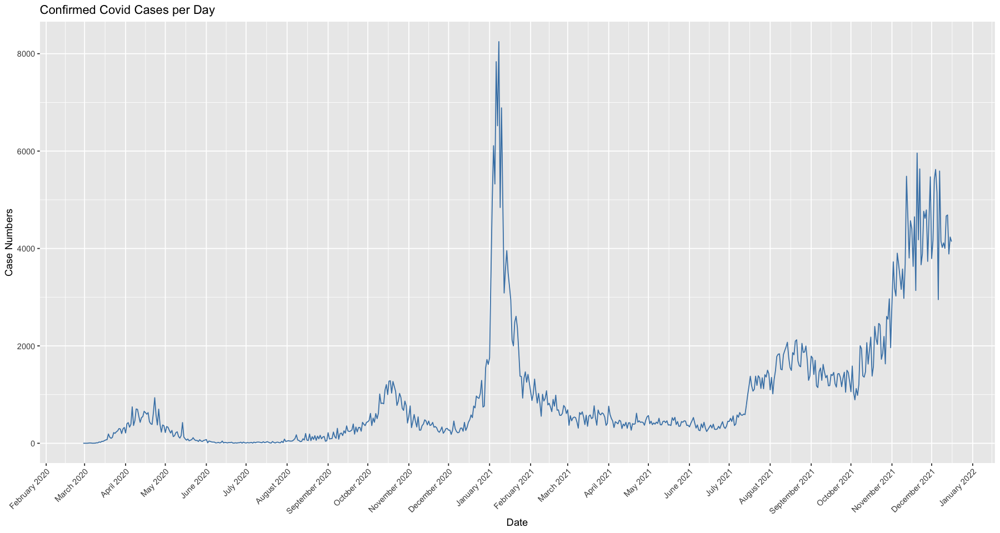

In [23]:
options(repr.plot.width=15, repr.plot.height=8)
library(ggplot2)

# Use ggplot() with a line geom to get a rough look at the data
cases <- ggplot(covid, aes(x=Date, y=ConfirmedCovidCases, na.rm = TRUE)) + geom_line(color="steelblue") + ggtitle("Confirmed Covid Cases per Day") + labs(y= "Case Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
cases

We can achieve a fuller look by trying to plot the same data using a bar plot.

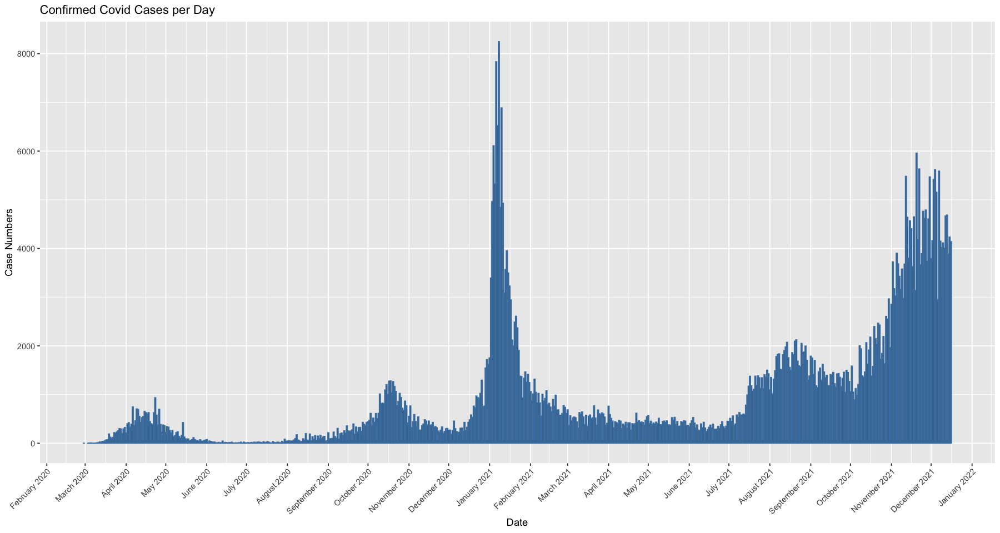

In [24]:
options(repr.plot.width=15, repr.plot.height=8)
library(ggplot2)

# We choose a bar graph geom
cases_bar <- ggplot(covid, aes(x=Date, y=ConfirmedCovidCases, na.rm = TRUE)) + geom_bar(stat="identity", color="steelblue") + ggtitle("Confirmed Covid Cases per Day") + labs(y= "Case Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
cases_bar

The four waves of the pandemic are clear. The first wave ran from February to August, 2020. The second from August to December, 2020. The third from December, 2020, to July, 2021. The fourth from July, 2021, to the present. The number of cases had dropped in October, 2021, but the numbers never dropped low enough to consider the later upturn a new wave. We are, therefore, still living in the fourth wave.

#### b) Five-Day Moving Average and Significant Dates

We can now plot the five-day moving average on top of the line graph, to smooth out the trend a little. The five-day moving average is now superimposed on the graph below in darker blue.

I have also added four significant dates: those belonging to the three major lockdowns in 2020 and the beginning of the nationwide vaccination programme. The dark-blue dotted lines indicate the date of the three most serious lockdowns — the first (**Lockdown 1**) on 27th March, 2020, the second (**Lockdown 2**) on 4th October, 2020, and the third (**Lockdown 3**) on Christmas Eve, 24th December, 2020. The heavier, dark-blue dashed line indicates the beginning of the nationwide **Vaccination Programme** on 29th December, 2020. 

There have been other periods of restriction, but these are the three most significant. Lockdown 1 was the most serious. On 15th September, 2020, the Government of Ireland announced a medium-term plan for living with COVID-19 that included five levels of restrictions. Lockdown 2 was Level 3 in the plan, Lockdown 3 was ultimately Level 5.

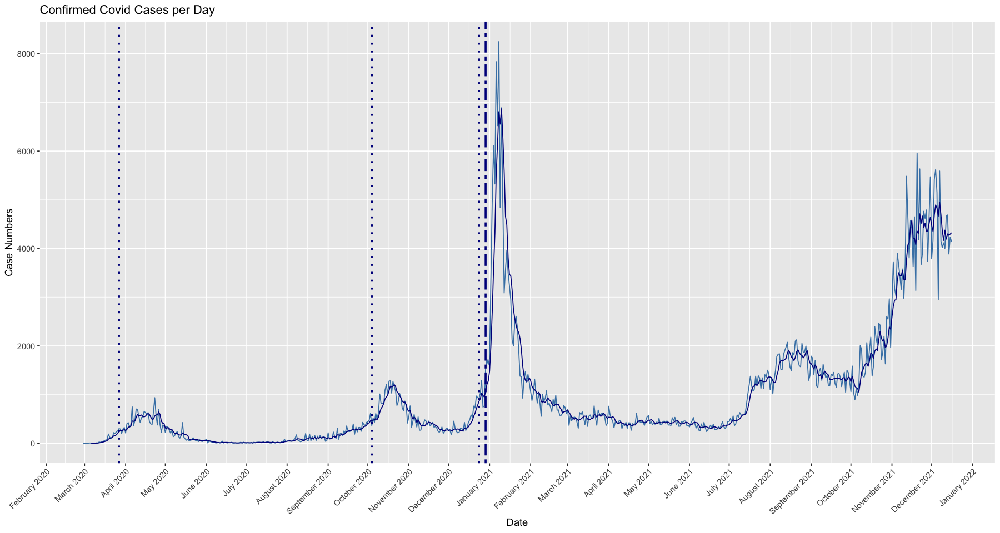

In [25]:
options(repr.plot.width=15, repr.plot.height=8)
library(ggplot2)
#Use a line geom, add the moving average, and add vertical lines at prominent dates
cases <- ggplot(covid, aes(x=Date, y=ConfirmedCovidCases, na.rm = TRUE)) + geom_line(color="steelblue") + ggtitle("Confirmed Covid Cases per Day") + labs(y= "Case Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + geom_line(aes(y = MA5), color="darkblue", na.rm = TRUE) + geom_vline(xintercept=as.Date("27/03/20", format = "%d/%m/%y"), linetype="dotted", color="darkblue", size=1) + geom_vline(xintercept=as.Date("04/10/20", format = "%d/%m/%y"), linetype="dotted", color="darkblue", size=1) + geom_vline(xintercept=as.Date("24/12/20", format = "%d/%m/%y"), linetype="dotted", color="darkblue", size=1) + geom_vline(xintercept=as.Date("29/12/20", format = "%d/%m/%y"), linetype="twodash", color="darkblue", size=1)
cases

#### c) Cleaner Presentation

If we wanted to generate the same plot, but with a clear background, and using a cleaner presentation, we could modify the background of our plot above, or we could use the *matplot()* function.

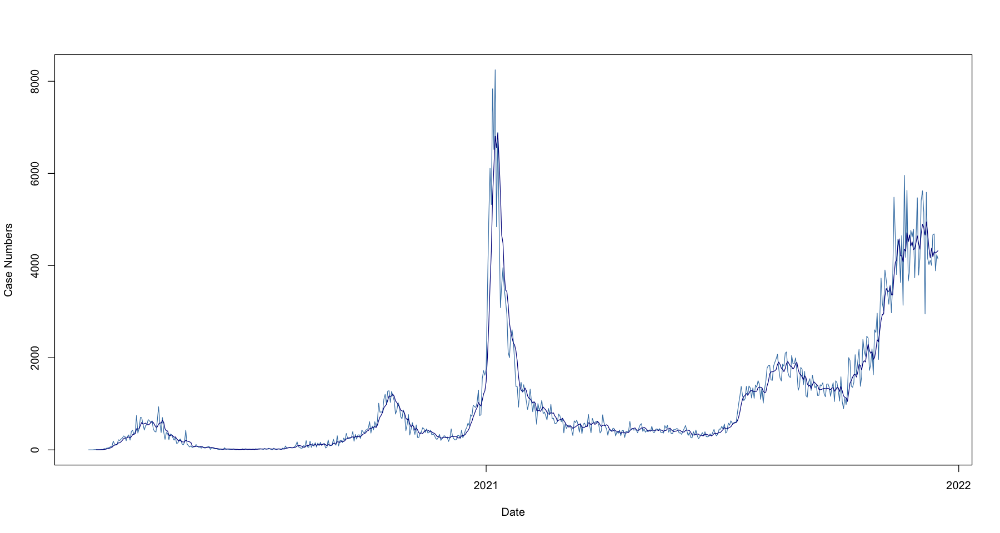

In [26]:
options(repr.plot.width=15, repr.plot.height=8)
# Use matplot() rather than ggplot()
matplot(x=covid$Date, cbind(covid$ConfirmedCovidCases,covid$MA5), type="l", col=c("steelblue","darkblue"), lty=c(1,1), xlab="Date", ylab="Case Numbers")

#### d) Recent Trend

Next, we can zoom in to see the most recent trend, from 1st September, 2021, up to the latest data. We can see from the five-day moving average, for example, that cases had been increasing from an average of just under 2,000 a day, to nearly 5,000 per day, but has now levelled off and dropped to just over 4,000 a day. There is no evidence yet of the effect of the new Omicron variant.

Warning message:
“Removed 548 row(s) containing missing values (geom_path).”


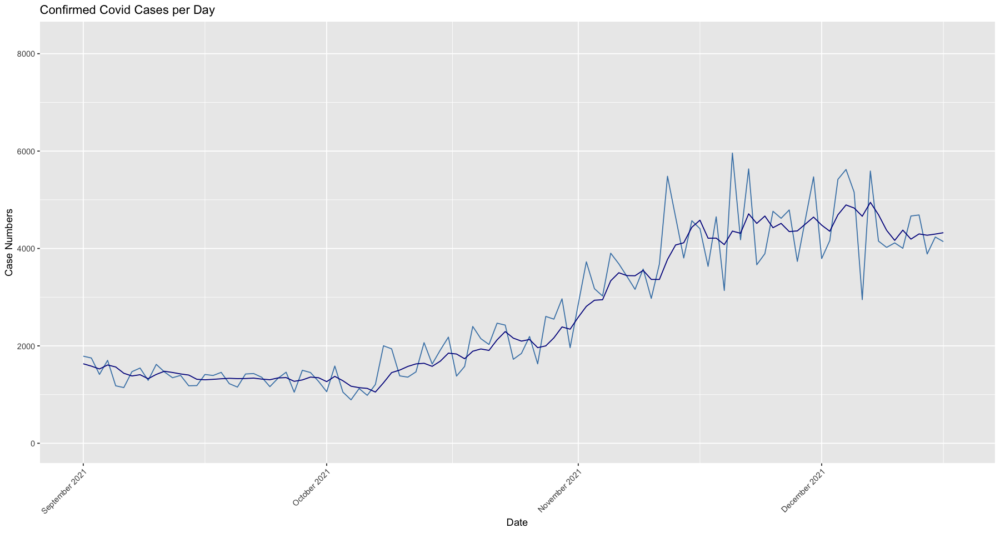

In [27]:
options(repr.plot.width=15, repr.plot.height=8)
library(ggplot2)
# Use ggplot with line geom, and moving average, but place limits on the x-axis
cases <- ggplot(covid, aes(x=Date, y=ConfirmedCovidCases, na.rm = TRUE)) + geom_line(color="steelblue") + ggtitle("Confirmed Covid Cases per Day") + labs(y= "Case Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y", limit=c(as.Date("2021-09-01"), as.Date("2021-12-17"))) + theme(axis.text.x = element_text(angle=45, hjust = 1)) + geom_line(aes(y = MA5), color="darkblue", na.rm = TRUE)
cases

It is left to be seen what effect the new Omicron variant will have on these numbers in the coming weeks.

#### e) Cumulative Cases

Next, we can generate a plot of the cumulative cases going back to the very beginning of the pandemic. The latest figures put the cumulative confirmed case numbers at 640,548. Ireland’s population was estimated by the Central Statistics Office (CSO) in April, 2021, to be 5.01 million. This implies that, assuming nobody was re-infected and everybody who became infected was registered as a confirmed case in the official statistics, about 13% of the total population have been infected with COVID-19 at present.

Loading required package: scales


Attaching package: ‘scales’


The following object is masked from ‘package:readr’:

    col_factor




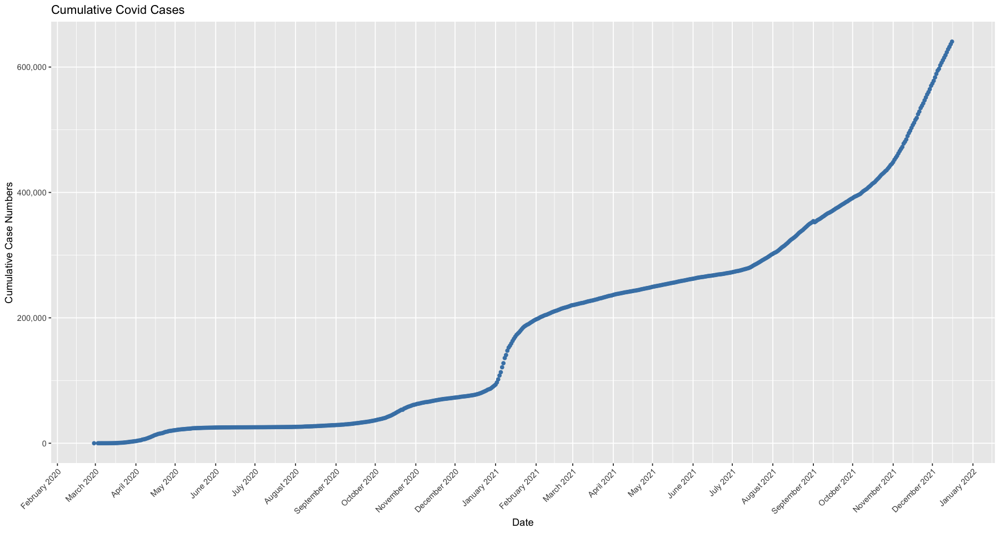

In [28]:
# Use scales package to use straightforward numbers on y-axis, rather than scientific notation
if (!require('scales')) install.packages('scales')
options(repr.plot.width=15, repr.plot.height=8)
#Use ggplot() with a basic scatter plot of points
cases_cumulative <- ggplot(covid, aes(x=Date, y=TotalConfirmedCovidCases)) + geom_point(color="steelblue") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + scale_y_continuous(labels = comma) + ggtitle("Cumulative Covid Cases") + labs(y= "Cumulative Case Numbers", x = "Date")
cases_cumulative

Finally, we can generate a box plot for the case numbers. Including all the data since the beginning of the pandemic, the median is 456 cases per day. However, this is not a very insightful measure in and of itself. It would be better to measure the central tendency during each individual wave.

In [29]:
median(covid$ConfirmedCovidCases)

[1] 456

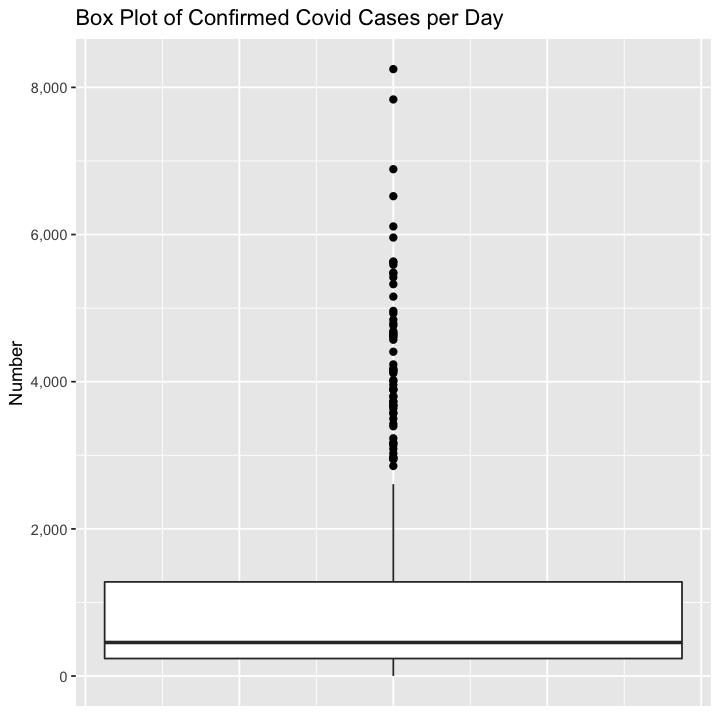

In [30]:
options(repr.plot.width=6, repr.plot.height=6)
# Use ggplot() with boxplot geom
agesprofile2 <- ggplot(covid, aes(y=ConfirmedCovidCases, na.rm = TRUE)) + geom_boxplot(outlier.colour="black", outlier.shape=16, outlier.size=2, notch=FALSE) + ggtitle("Box Plot of Confirmed Covid Cases per Day") + ylab("Number") + scale_y_continuous(labels = comma) + theme(axis.title.x=element_blank(), axis.text.x=element_blank(), axis.ticks.x=element_blank())
agesprofile2

The outliers in this plot, large case numbers per day, emerged at the peak of the two biggest waves.

### ii. Deaths <a class="anchor" id="deaths-bullet"></a>

[TOP ↑](#top)

Next, we can plot the number of deaths.

However, there is an issue with the data, in that daily deaths were no longer recorded after a certain cutoff date. I propose to deal with this in a number of ways: splitting the data up, aggregating the daily deaths prior to the cutoff, and plotting the cumulative numbers.

#### a) Data Division — Cutoff Date

First, we will split our data into two sets, before and after the 17th June, 2021. In order to deal with the many missing values in the ConfirmedCovidDeaths feature, I will also filter the data to include only relevant rows. We can then plot the data in two graphs, side-by-side. 

In [31]:
library(dplyr)
# Create two data sets, before and after 17th June, 2021
beforejune <- covid[which(covid$Date < as.Date("17/06/21", format = "%d/%m/%y")),]
afterjune <- covid[which(covid$Date >= as.Date("17/06/21", format = "%d/%m/%y")),]
# Filter the data to exclude rows containing NA
afterjune <- dplyr::filter(afterjune, !is.na(ConfirmedCovidDeaths))

We can now generate a side-by-side plot of daily deaths before 17th June, 2021, and weekly deaths after.

Loading required package: gridExtra


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




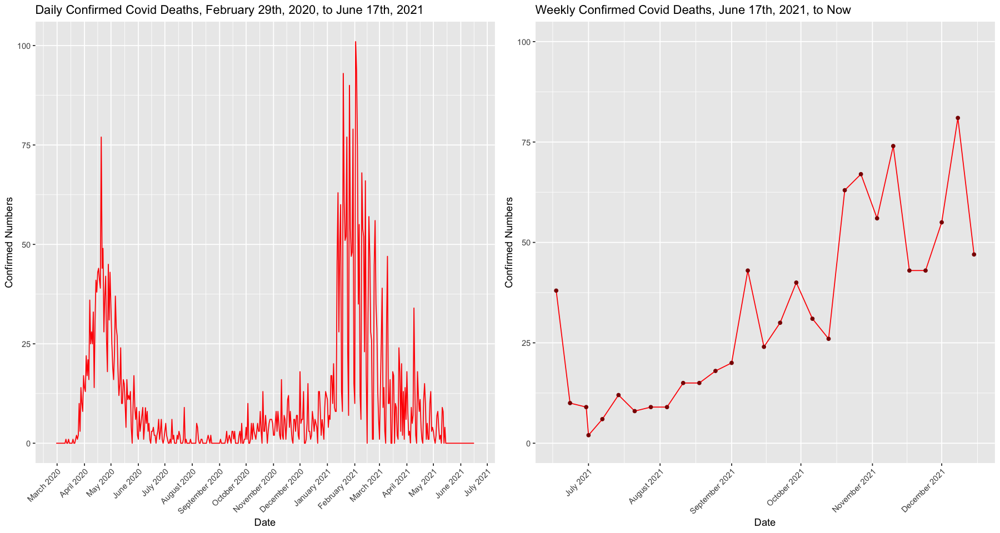

In [32]:
options(repr.plot.width=15, repr.plot.height=8)
deaths_before_june <- ggplot(beforejune, aes(x=Date, y=ConfirmedCovidDeaths, na.rm=T)) + geom_line(color="red", na.rm=T) + ggtitle("Daily Confirmed Covid Deaths, February 29th, 2020, to June 17th, 2021") + labs(y= "Confirmed Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
deaths_after_june <- ggplot(afterjune, aes(x=Date, y=ConfirmedCovidDeaths, na.rm=T)) + geom_line(color="red", na.rm=T) + geom_point(color="darkred") + ylim(0, 100) + ggtitle("Weekly Confirmed Covid Deaths, June 17th, 2021, to Now") + labs(y= "Confirmed Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
require(gridExtra)
grid.arrange(deaths_before_june, deaths_after_june, ncol=2)

However, this is not very satisfactory as it's difficult to compare the two graphs directly.

#### b) Data Division — 2020

We can isolate the data and plot the daily deaths from last year, 2020.

Warning message:
“Removed 168 row(s) containing missing values (geom_path).”


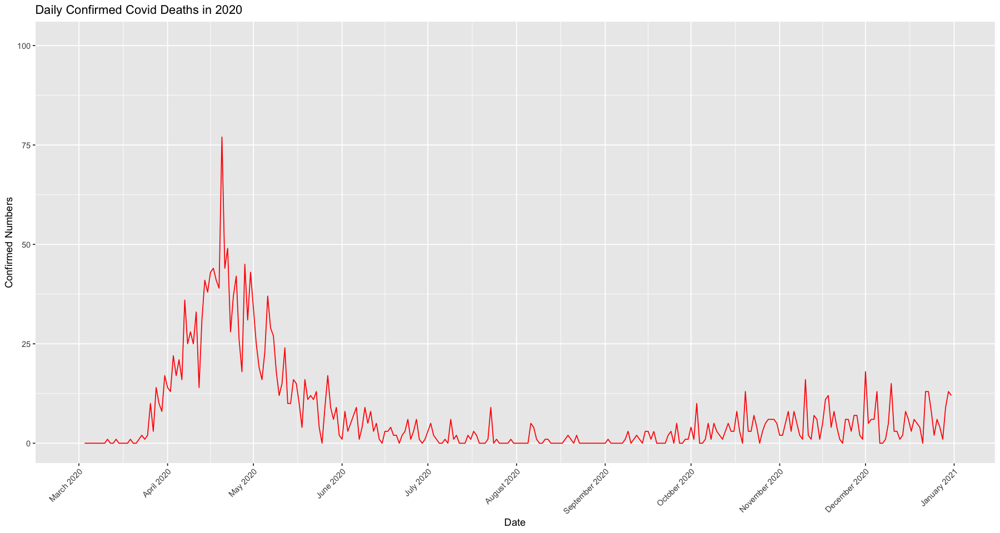

In [33]:
options(repr.plot.width=15, repr.plot.height=8)
#ggplot() with line geom
ggplot(beforejune, aes(x=Date, y=ConfirmedCovidDeaths)) + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y", limit=c(as.Date("2020-03-01"), as.Date("2020-12-31"))) + geom_line(color="red") + ggtitle("Daily Confirmed Covid Deaths in 2020") + labs(y= "Confirmed Numbers", x = "Date") + theme(axis.text.x = element_text(angle=45, hjust = 1))

#### c) Aggregating to Weekly Deaths

Finally, we can aggregate the daily figures from prior to June 17th, 2021, to produce a continuous set of weekly death totals going back to the start of the pandemic. This allows for an uninterrupred continuous comparison. 

I have also added the same four significant dates looked at previously: those belonging to three major lockdowns and the beginning of the nationwide vaccination programme. The dark-red dotted lines indicate the date of the three most serious lockdowns — the first (Lockdown 1) on 27th March, 2020, the second (Lockdown 2) on 4th October, 2020, and the third (Lockdown 3) on Christmas Eve, 24th December, 2020. The heavier, dark-red dashed line indicates the beginning of the nationwide vaccination programme on 29th December, 2020.

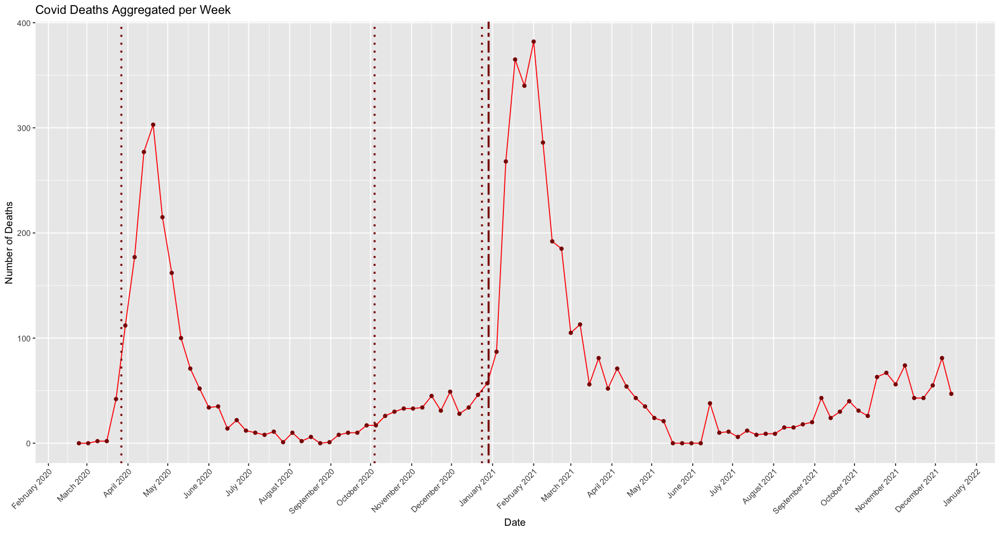

In [34]:
options(repr.plot.width=15, repr.plot.height=8)
# Cut the data into weeks
week <- as.Date(cut(covid$Date, "week"))
# Aggregate the data by week
weektotals <- aggregate(ConfirmedCovidDeaths ~ week, covid, sum)
# Plot the whole data set in a line graph
ggplot(weektotals, aes(x=week, y=ConfirmedCovidDeaths)) + geom_line(color="red") + geom_point(color="darkred") + geom_vline(xintercept=as.Date("27/03/20", format = "%d/%m/%y"), linetype="dotted", color="darkred", size=1) + geom_vline(xintercept=as.Date("04/10/20", format = "%d/%m/%y"), linetype="dotted", color="darkred", size=1) + geom_vline(xintercept=as.Date("24/12/20", format = "%d/%m/%y"), linetype="dotted", color="darkred", size=1) + geom_vline(xintercept=as.Date("29/12/20", format = "%d/%m/%y"), linetype="twodash", color="darkred", size=1) + ggtitle("Covid Deaths Aggregated per Week") + labs(y= "Number of Deaths", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))

We can see that deaths have not returned to the sort of numbers we were seeing in the first and third waves, in spite of a relaxation of restrictions. This is likely due to the vaccination programme.

#### d) Cumulative Deaths

Finally, we can plot the cumulative deaths since the pandemic began. The latest figures show that 5,835 people have died in Ireland from COVID-19.

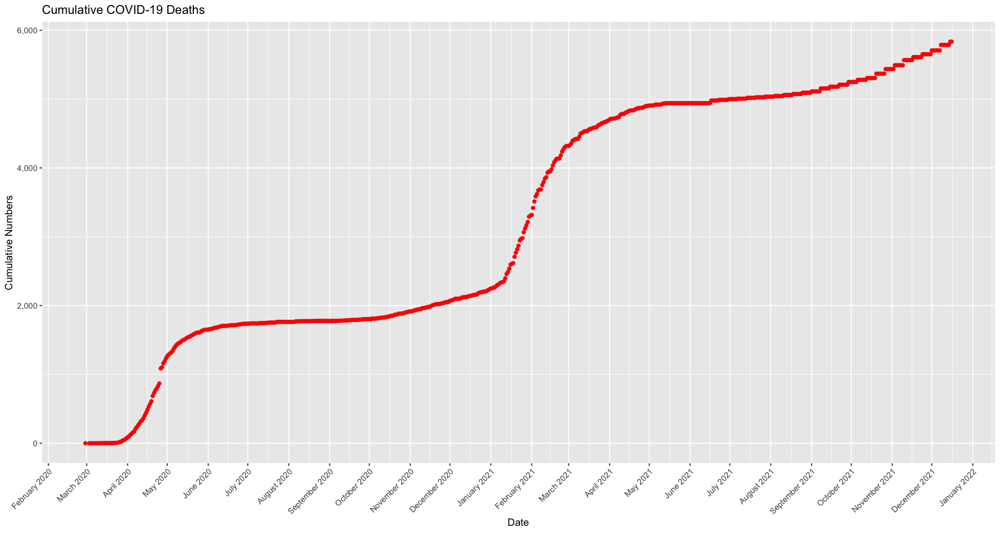

In [35]:
options(repr.plot.width=15, repr.plot.height=8)
# We use scales to coerce ggplot() away from scientific notation
if (!require('scales')) install.packages('scales')
deaths_cumulative <- ggplot(covid, aes(x=Date, y=TotalCovidDeaths)) + geom_point(color="red") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + scale_y_continuous(labels = comma) + ggtitle("Cumulative COVID-19 Deaths") + labs(y= "Cumulative Numbers", x = "Date")
deaths_cumulative

### SECONDARY STATISTICS <a class="anchor" id="secondary"></a>

[TOP ↑](#top)

Next, we can examine the secondary statistics — **hospitalisations**, **ICU admissions**, **cases among healthcare workers**, and the **age profile of cases**. This is all based on the Statistics Profile Date, lagged by two days behind the primary date.

### iii. Hospitalisations <a class="anchor" id="hospital-bullet"></a>

[TOP ↑](#top)

First, we can look at hospitalisations.

#### a) Daily Hospitalisations

We can get a rough idea of the total number of daily hospitalisations by generating a simple line plot.

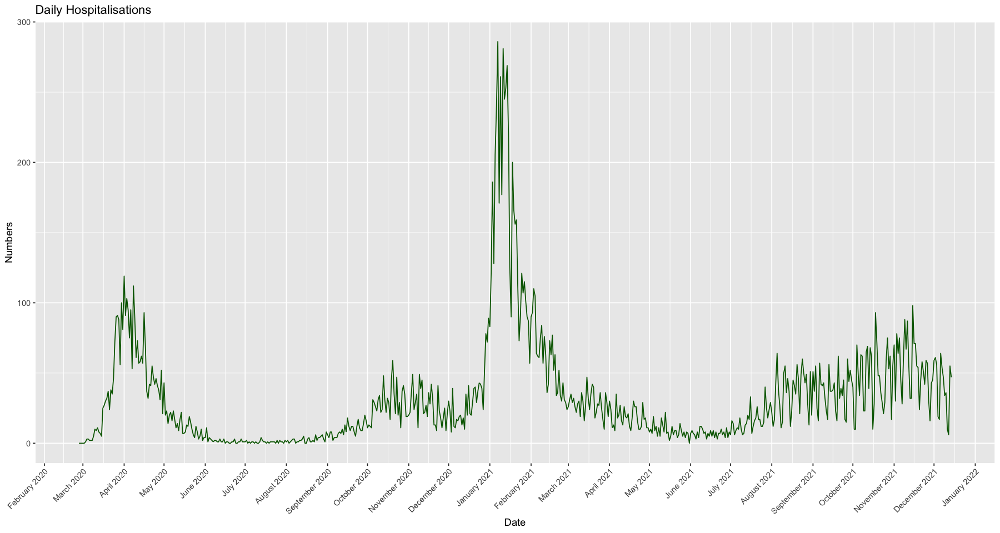

In [36]:
library(ggplot2)
hospitalisations <- ggplot(covid, aes(x=StatisticsProfileDate, y=DailyHospitalised, na.rm = TRUE)) + geom_line(color="darkgreen") + ggtitle("Daily Hospitalisations") + labs(y= "Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
hospitalisations
options(repr.plot.width=15, repr.plot.height=8)

Like deaths, hospitalisations have not returned to the numbers witnessed during the first and third waves, in spite of surging cases. This must, in part, be due to vaccinations. Recently, the numbers in hospital have actually fallen.

#### b) Daily Hospitalisations by Age Cohort

We can get more interesting picture by plotting the hospitalisations by age cohort. In order to do this, we must select the relevant features and collapse them into a long format, making the cohorts factors for ease of visualisation. We can plot the groups by choosing the relevant columns using *select()*, converting them into a long data frame using *gather()*, and then making them into factors. 

In [37]:
library(dplyr)
library(tidyr)

# Choose the relevant features for selection
cols <- c('StatisticsProfileDate', 'DailyHospitalisedAged5', 'DailyHospitalisedAged5to14', 'DailyHospitalisedAged15to24', 'DailyHospitalisedAged25to34', 'DailyHospitalisedAged35to44', 'DailyHospitalisedAged45to54', 'DailyHospitalisedAged55to64', 'DailyHospitalisedAged65to74', 'DailyHospitalisedAged75to84', 'DailyHospitalisedAged85up')
# Use select() to create new data frame
covid_hosp <- select(covid, cols)
# Use gather() to convert from wide to long format
hospitalisation_groups <- gather(covid_hosp, agegroup, value, -StatisticsProfileDate)
# Ensure that the age cohorts are factors, with desired labels
hospitalisation_groups$agegroup <- factor(hospitalisation_groups$agegroup, order = TRUE, levels = c('DailyHospitalisedAged5', 'DailyHospitalisedAged5to14', 'DailyHospitalisedAged15to24', 'DailyHospitalisedAged25to34', 'DailyHospitalisedAged35to44', 'DailyHospitalisedAged45to54', 'DailyHospitalisedAged55to64', 'DailyHospitalisedAged65to74', 'DailyHospitalisedAged75to84', 'DailyHospitalisedAged85up'), labels = c('Aged 1 to 4', 'Aged 5 to 14', 'Aged 15 to 24', 'Aged 25 to 34', 'Aged 35 to 44', 'Aged 45 to 54', 'Aged 55 to 64', 'Aged 65 to 74', 'Aged 75 to 84', 'Aged 85 up'))

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(cols)` instead of `cols` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.



First, we can plot a simple line graph.

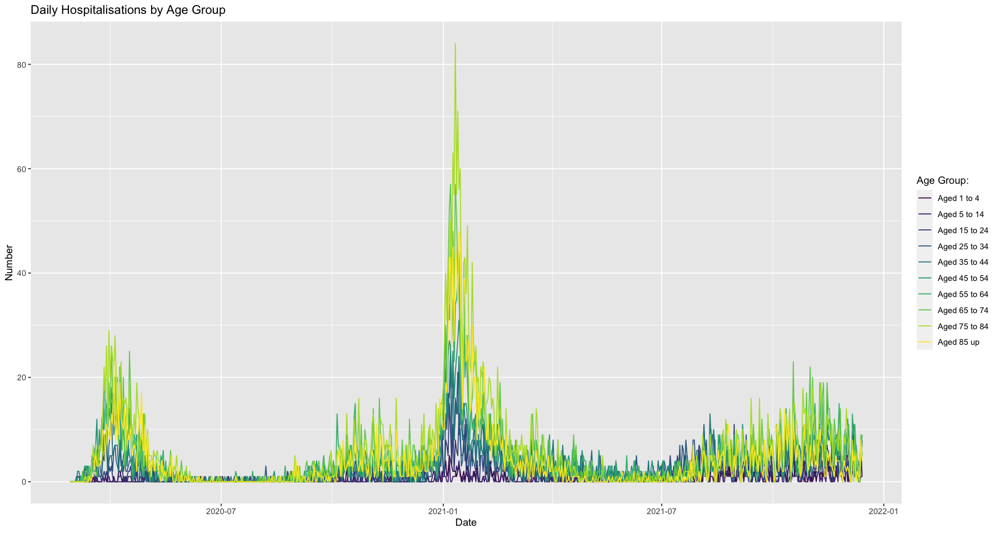

In [38]:
library(ggplot2)
# Plot a basic line graph
hospital_plot <- hospitalisation_groups %>% ggplot(aes(x = StatisticsProfileDate, y = value, color = agegroup)) + geom_line() + xlab("Date") + ylab("Number") + labs(color='Age Group:') + ggtitle("Daily Hospitalisations by Age Group")
hospital_plot 

This graph has some limitations due to its complexity. We might try a bar graph alternative.

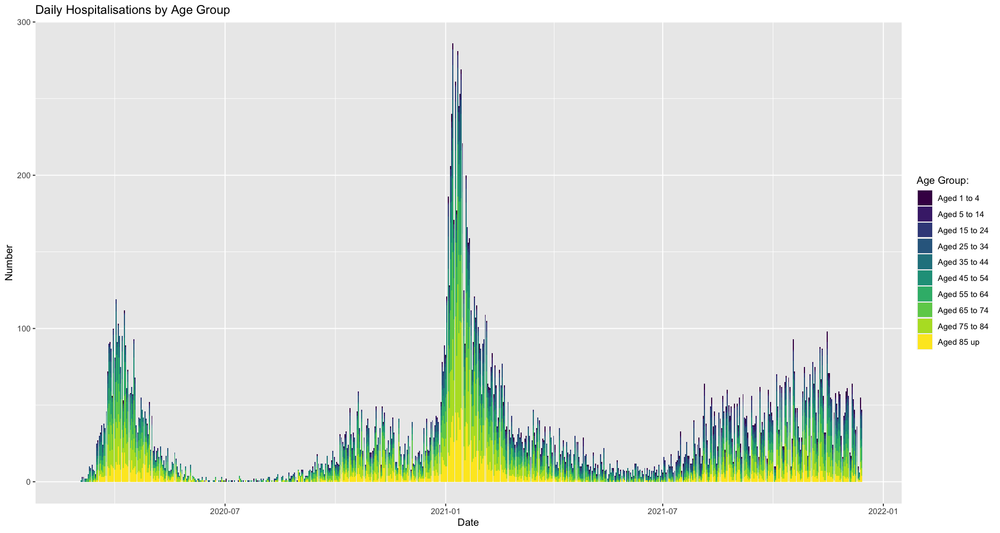

In [39]:
library(ggplot2)
# Use ggplot() with bar graph geom
hospital_plot_bar <- hospitalisation_groups %>% ggplot(aes(x = StatisticsProfileDate, y = value, fill = agegroup)) + geom_bar(stat="identity") + xlab("Date") + ylab("Number") + labs(fill='Age Group:') + ggtitle("Daily Hospitalisations by Age Group")
hospital_plot_bar 

This is a much nicer visualisation. You can see clearly that the older cohorts are proportionately lower in this most recent wave of hospitalisations when compared with previous waves prior to vaccination rollout. This might be attributed, at least in part, to the vaccination and booster programme.

This plot is still a little busy, so it might be better to split the data into separate plots using *facet_wrap*. This makes it quite obvious that hospitalisations are concentrated in the older age groups, but a much smaller proportion compared to previously.

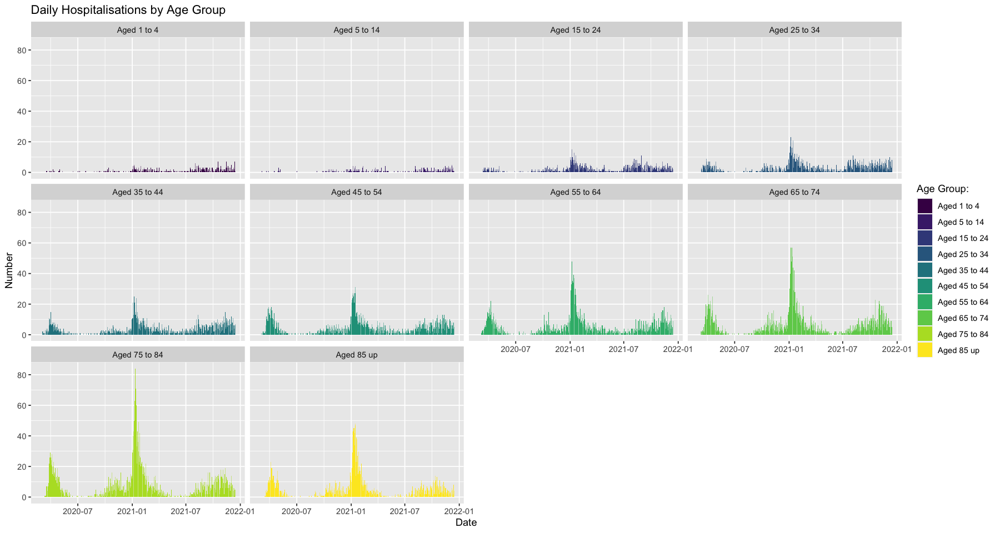

In [40]:
library(ggplot2)
options(repr.plot.width=15, repr.plot.height=8)
# ggplot() with facet_wrap()
ggplot(hospitalisation_groups,aes(x=StatisticsProfileDate,y=value,fill=agegroup)) + geom_bar(stat='identity') + facet_wrap(~agegroup) + xlab("Date") + ylab("Number") + guides(fill=guide_legend(title="Age Group:")) + labs(color="Age Groups:") + ggtitle("Daily Hospitalisations by Age Group")

#### c) Daily Hospitalisations — Recent Trend

Finally, we can zoom in to examine the recent trend. First, we can plot a line graph.

Warning message:
“Removed 6250 row(s) containing missing values (geom_path).”


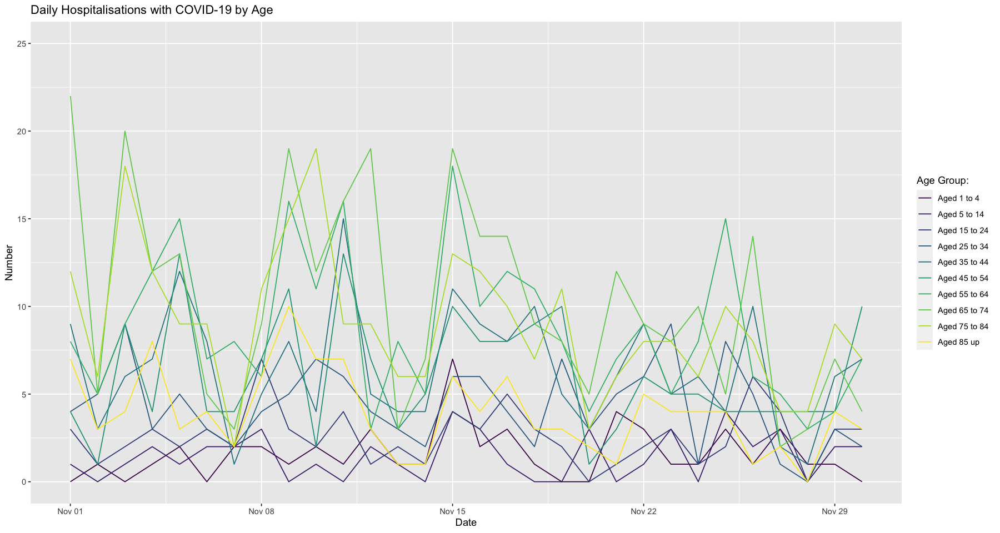

In [41]:
library(ggplot2)
# Line plot
hospitalisation_groups %>% ggplot(aes(x = StatisticsProfileDate, y = value, color = agegroup)) + geom_line() + scale_x_date(limit=c(as.Date("2021-11-01"), as.Date("2021-11-30"))) + ylim(0, 25) + ggtitle("Daily Hospitalisations with COVID-19 by Age") + labs(y= "Number", x = "Date") + labs(color='Age Group:')

We might achieve a clearer picture by using a bar graph.

Warning message:
“Removed 6110 rows containing missing values (position_stack).”
Warning message:
“Removed 249 rows containing missing values (geom_bar).”


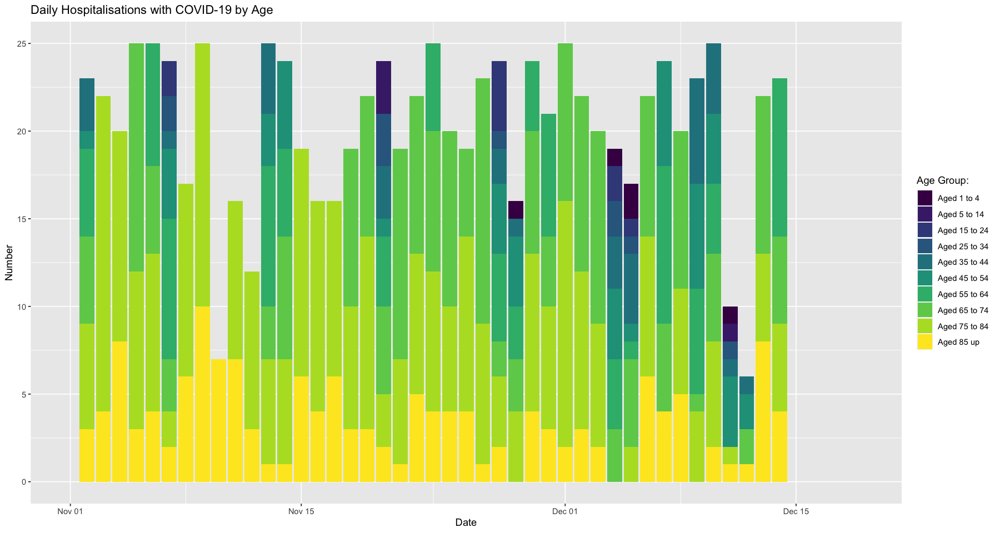

In [42]:
library(ggplot2)
# Bar plot
hospitalisation_groups %>% ggplot(aes(x = StatisticsProfileDate, y = value, fill = agegroup)) + geom_bar(stat="identity") + scale_x_date(limit=c(as.Date("2021-11-01"), as.Date("2021-12-19"))) + ylim(0, 25) + ggtitle("Daily Hospitalisations with COVID-19 by Age") + labs(y= "Number", x = "Date") + guides(fill=guide_legend(title="Age Group:"))

It's clear that hospitalisations have stabilised around the 25 per day mark, and are dominated by the older cohorts.

#### d) Cumulative Hospitalisations

Finally, we can plot the cumulative hospitalisations since the beginning of the pandemic. The number has reached 21,235 in the most recent release.

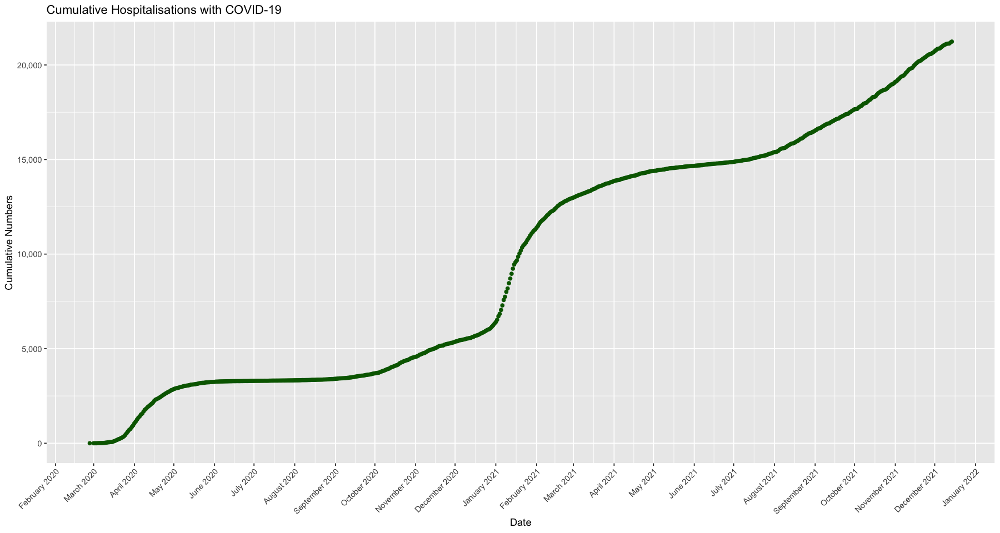

In [43]:
if (!require('scales')) install.packages('scales')
hosp_cumulative <- ggplot(covid, aes(x=StatisticsProfileDate, y=HospitalisedCovidCases)) + geom_point(color="darkgreen") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + scale_y_continuous(labels = comma) + ggtitle("Cumulative Hospitalisations with COVID-19") + labs(y= "Cumulative Numbers", x = "Date")
hosp_cumulative
options(repr.plot.width=15, repr.plot.height=8)

### iv. ICU Admissions <a class="anchor" id="icu-bullet"></a>

[TOP ↑](#top)

Now, we can turn to ICU admissions numbers. We can start by plotting this data on a line graph.

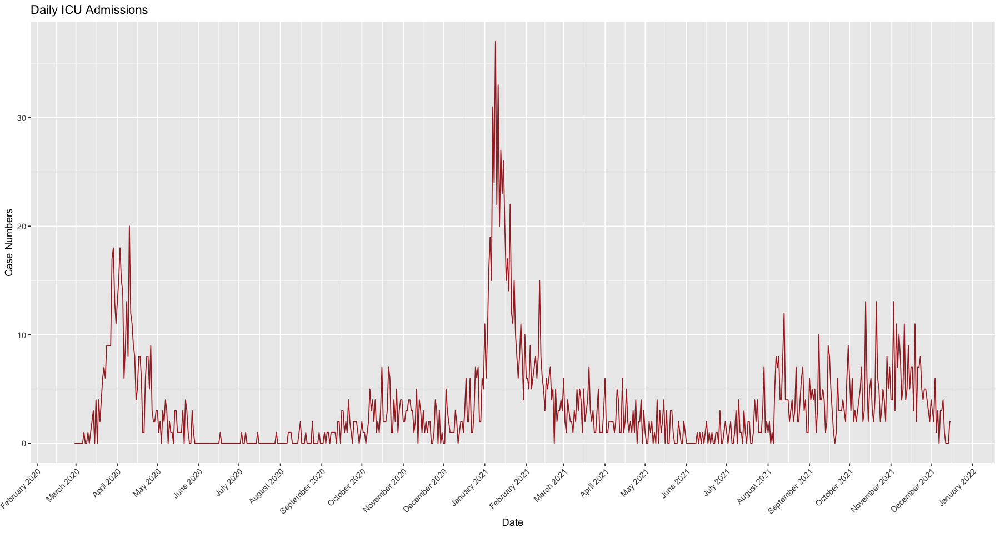

In [44]:
library(ggplot2)
icus <- ggplot(covid, aes(x=Date, y=DailyICU, na.rm = TRUE)) + geom_line(color="brown") + ggtitle("Daily ICU Admissions") + labs(y= "Case Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
icus
options(repr.plot.width=15, repr.plot.height=8)

The recent trend is very much downward. There has been a dramatic fall in numbers being admitted to ICU.

### v. Cases: Healthcare Workers <a class="anchor" id="hcw-bullet"></a>

[TOP ↑](#top)

We can plot the data on a simple line graph. The recent trend is very much downward.

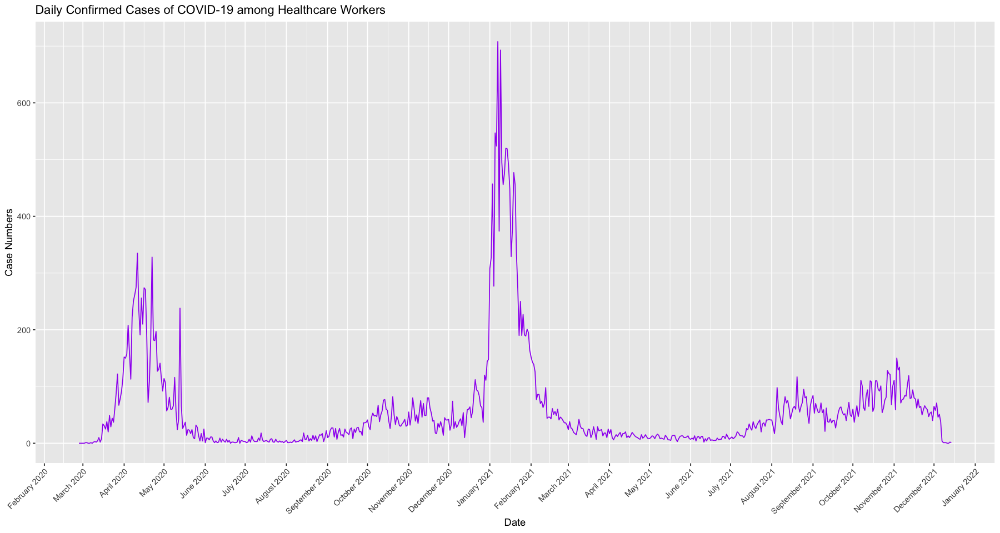

In [45]:
library(ggplot2)
options(repr.plot.width=15, repr.plot.height=8)
hcws <- ggplot(covid, aes(x=StatisticsProfileDate, y=DailyHCWCovidCases, na.rm = TRUE)) + geom_line(color="purple") + ggtitle("Daily Confirmed Cases of COVID-19 among Healthcare Workers") + labs(y= "Case Numbers", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
hcws

### vi. Cases: Age Profile <a class="anchor" id="age-bullet"></a>

[TOP ↑](#top)

#### a) Box Plot

First, we can generate a box plot of the median age of those infected with COVID-19. The median age is 33. This, however, is not very insightful.

In [46]:
median(covid$Median_Age, na.rm = TRUE)

[1] 33

Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”


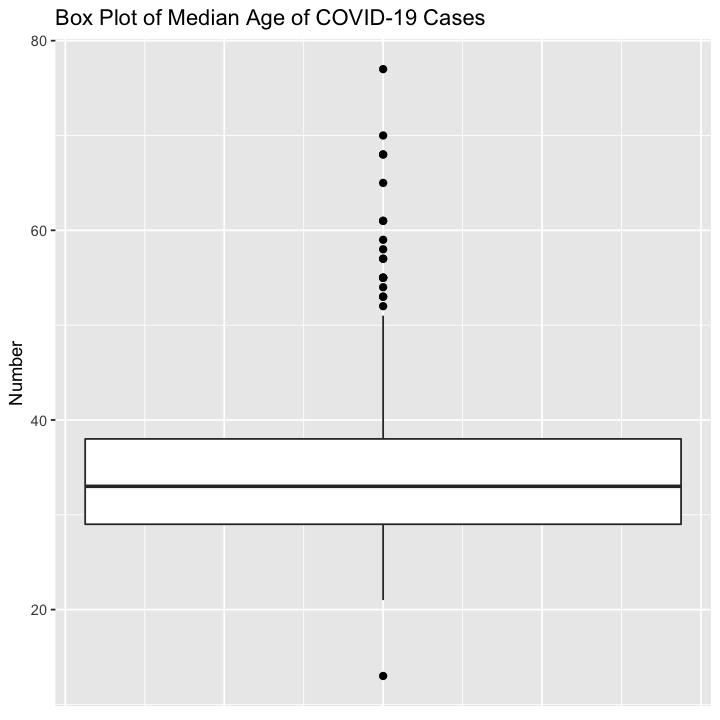

In [47]:
require(scales)
options(repr.plot.width=6, repr.plot.height=6)
agesprofile2 <- ggplot(covid, aes(y=Median_Age, na.rm = TRUE)) + geom_boxplot(outlier.colour="black", outlier.shape=16, outlier.size=2, notch=FALSE) + ggtitle("Box Plot of Median Age of COVID-19 Cases") + ylab("Number") + scale_y_continuous(labels = comma) + theme(axis.title.x=element_blank(), axis.text.x=element_blank(), axis.ticks.x=element_blank())
agesprofile2

#### b) Tracking Median Age

We can get more insight by looking at the daily median age of people with COVID-19, throughout the pandemic. 

Warning message:
“Removed 2 row(s) containing missing values (geom_path).”


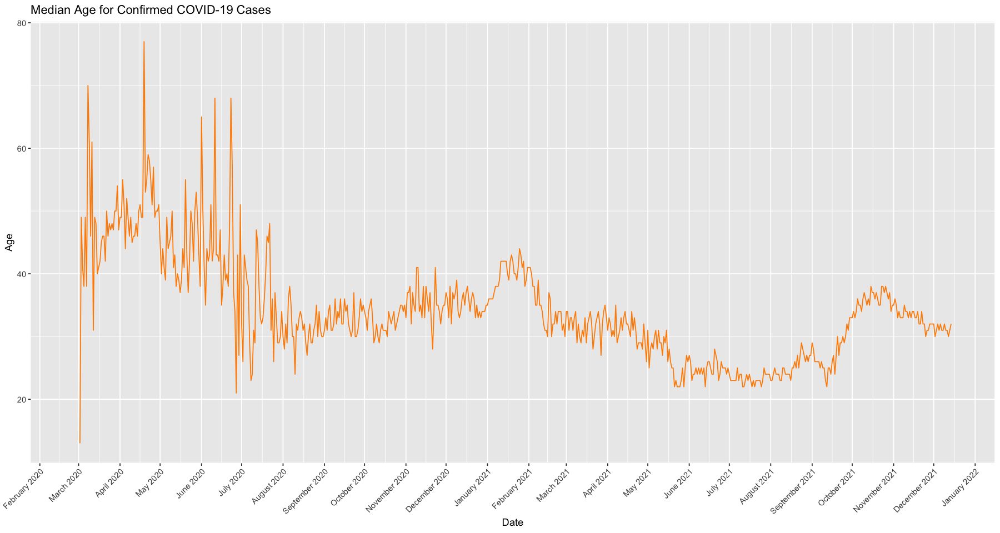

In [48]:
library(ggplot2)
options(repr.plot.width=15, repr.plot.height=8)
agesprofile <- ggplot(covid, aes(x=StatisticsProfileDate, y=Median_Age, na.rm = TRUE)) + geom_line(color="darkorange") + ggtitle("Median Age for Confirmed COVID-19 Cases") + labs(y= "Age", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1))
agesprofile
options(repr.plot.width=15, repr.plot.height=8)

We can see, broadly, that the median age of those with COVID-19 has dropped since the start of the pandemic. The median has gone from a peak of over 60 in the first wave to the current value of mid-30s.

#### c) Daily Cases by Age Cohort

We can get more interesting picture by plotting the hospitalisations by age cohort. In order to do this, we must select the relevant features and collapse them into a long format, making the cohorts factors for ease of visualisation.

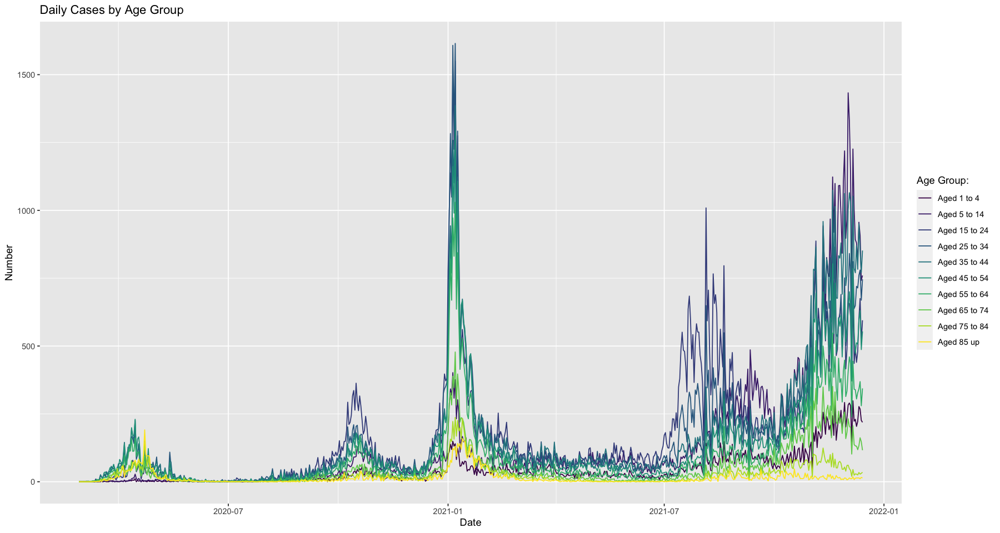

In [49]:
library(dplyr)
library(tidyr)
library(ggplot2)

options(repr.plot.width=15, repr.plot.height=8)
# Create a list which contains the columns we want to select()
cols <- c('StatisticsProfileDate', 'DailyAged1to4', 'DailyAged5to14', 'DailyAged15to24', 'DailyAged25to34', 'DailyAged35to44', 'DailyAged45to54', 'DailyAged55to64', 'DailyAged65to74', 'DailyAged75to84', 'DailyAged85up')
covid_cases_by_age <- select(covid, cols)

# Convert from a wide to a long format using the gather() function
covid_cases_by_age_long <- gather(covid_cases_by_age, agegroup, value, -StatisticsProfileDate)

# Make the age cohorts into factors with the desired labels
covid_cases_by_age_long$agegroup <- factor(covid_cases_by_age_long$agegroup, order = TRUE, levels = c('DailyAged1to4', 'DailyAged5to14', 'DailyAged15to24', 'DailyAged25to34', 'DailyAged35to44', 'DailyAged45to54', 'DailyAged55to64', 'DailyAged65to74', 'DailyAged75to84', 'DailyAged85up'), labels = c('Aged 1 to 4', 'Aged 5 to 14', 'Aged 15 to 24', 'Aged 25 to 34', 'Aged 35 to 44', 'Aged 45 to 54', 'Aged 55 to 64', 'Aged 65 to 74', 'Aged 75 to 84', 'Aged 85 up'))

# Plot the data with a basic line graph
cases_plot <- covid_cases_by_age_long %>% ggplot(aes(x = StatisticsProfileDate, y = value, color = agegroup)) + geom_line() + xlab("Date") + ylab("Number") + labs(color='Age Group:') + ggtitle("Daily Cases by Age Group")
cases_plot

This type of graph is a little hard to interpret, so we can plot the same data using a bar plot.

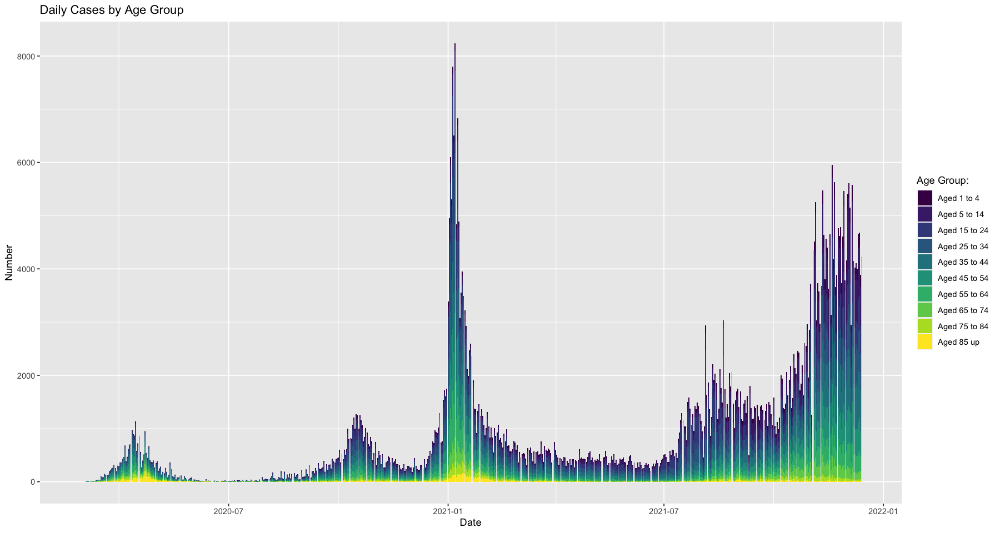

In [50]:
library(dplyr)
library(tidyr)
library(ggplot2)
options(repr.plot.width=15, repr.plot.height=8)

# A repeat of the above process, but plotting a bar graph
cols <- c('StatisticsProfileDate', 'DailyAged1to4', 'DailyAged5to14', 'DailyAged15to24', 'DailyAged25to34', 'DailyAged35to44', 'DailyAged45to54', 'DailyAged55to64', 'DailyAged65to74', 'DailyAged75to84', 'DailyAged85up')
covid_cases_by_age <- select(covid, cols)
covid_cases_by_age_long <- gather(covid_cases_by_age, agegroup, value, -StatisticsProfileDate)
covid_cases_by_age_long$agegroup <- factor(covid_cases_by_age_long$agegroup, order = TRUE, levels = c('DailyAged1to4', 'DailyAged5to14', 'DailyAged15to24', 'DailyAged25to34', 'DailyAged35to44', 'DailyAged45to54', 'DailyAged55to64', 'DailyAged65to74', 'DailyAged75to84', 'DailyAged85up'), labels = c('Aged 1 to 4', 'Aged 5 to 14', 'Aged 15 to 24', 'Aged 25 to 34', 'Aged 35 to 44', 'Aged 45 to 54', 'Aged 55 to 64', 'Aged 65 to 74', 'Aged 75 to 84', 'Aged 85 up'))
cases_plot_bar <- covid_cases_by_age_long %>% ggplot(aes(x=StatisticsProfileDate, y=value, fill = agegroup)) + geom_bar(stat="identity") + xlab("Date") + ylab("Number") + labs(fill='Age Group:') + ggtitle("Daily Cases by Age Group")
cases_plot_bar

This is a much nicer visualisation. You can see clearly that the older cohorts are proportionately lower in this most recent wave of confirmed cases.

Finally, we can visualise this data in another way, by making use of a *facet_wrap()*. You can see quite clearly that cases among those aged 5 to 44 are a much larger proportion in recent weeks.

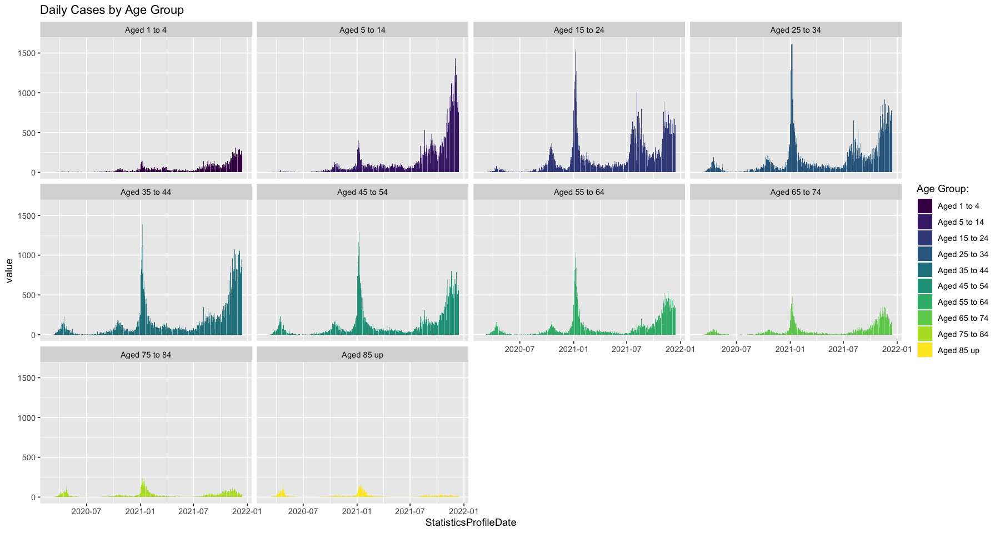

In [51]:
library(ggplot2)

#Use a facet_wrap
ggplot(covid_cases_by_age_long, aes(x=StatisticsProfileDate,y=value,fill=agegroup)) + geom_bar(stat='identity') + facet_wrap(~agegroup) + guides(fill=guide_legend(title="Age Group:")) + ggtitle("Daily Cases by Age Group")

#### d) Cases vs Hospitalisations

We can compare directly the two graphs depicting daily cases and daily hospitalisations. We can see that these are a mirror image of one another, reversed in the sense that daily cases are very high among younger cohorts while daily hospitalisations are higher among older cohorts, as we might expect. Age is a risk factor when it comes to hospitalisation. However, there is also an obvious suppression of hospitalisations over all.

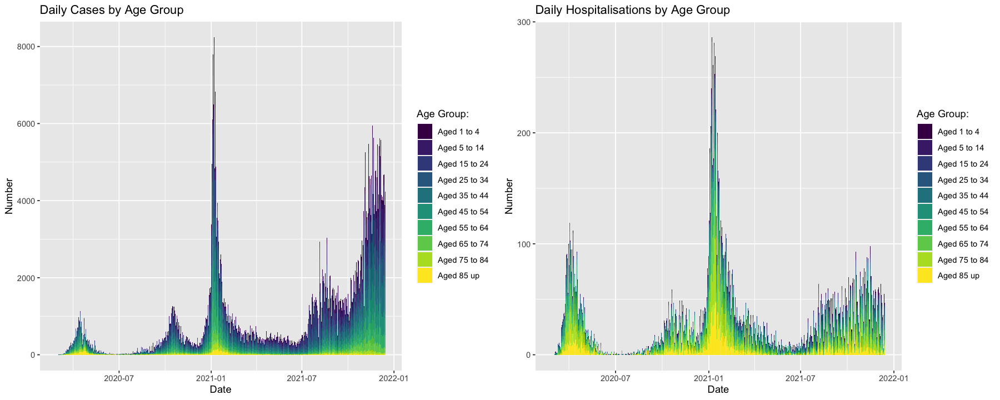

In [52]:
options(repr.plot.width=15, repr.plot.height=6)
# Use gridExtra to plot graphs side-by-side
require(gridExtra)
grid.arrange(cases_plot_bar, hospital_plot_bar, ncol=2)

### vi. Cases: Men vs Women <a class="anchor" id="sex-bullet"></a>

[TOP ↑](#top)

Next, we can investigate if there are differences in case numbers between men and women.

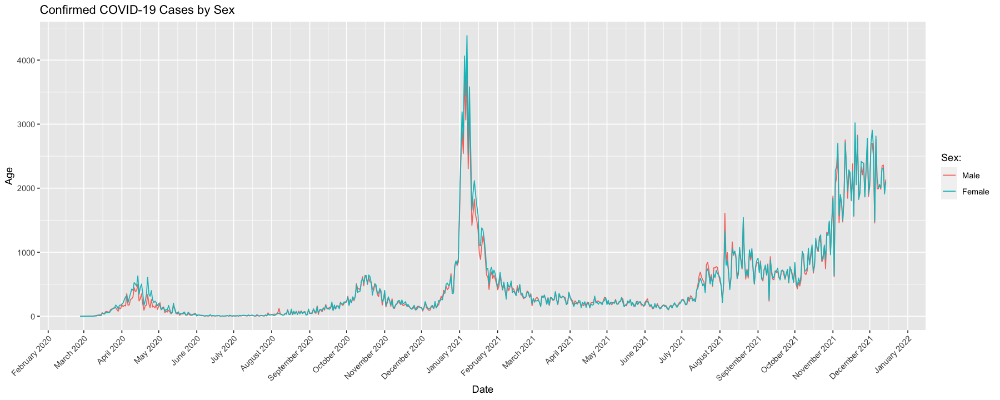

In [53]:
library(dplyr)
library(tidyr)
library(ggplot2)

cols <- c('StatisticsProfileDate', 'DailyMale', 'DailyFemale')
covid_cases_by_sex <- select(covid, cols)
covid_cases_by_sex_long <- gather(covid_cases_by_sex, sex, number, -StatisticsProfileDate)
covid_cases_by_sex_long$sex <- factor(covid_cases_by_sex_long$sex, order = FALSE, levels = c('DailyMale', 'DailyFemale'), labels = c('Male', 'Female'))
covid_cases_by_sex_long %>% ggplot(aes(x = StatisticsProfileDate, y = number, color = sex)) + geom_line()  + ggtitle("Confirmed COVID-19 Cases by Sex") + labs(y= "Age", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + labs(color='Sex:')

Again, this graph is a little difficult to read. Let's switch to a bar plot.

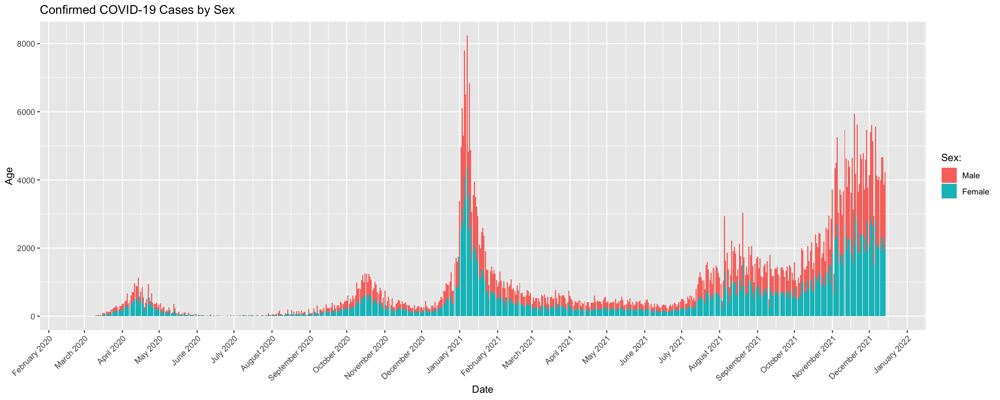

In [54]:
library(dplyr)
library(tidyr)
library(ggplot2)

cols <- c('StatisticsProfileDate', 'DailyMale', 'DailyFemale')
covid_cases_by_sex <- select(covid, cols)
covid_cases_by_sex_long <- gather(covid_cases_by_sex, sex, number, -StatisticsProfileDate)
covid_cases_by_sex_long$sex <- factor(covid_cases_by_sex_long$sex, order = FALSE, levels = c('DailyMale', 'DailyFemale'), labels = c('Male', 'Female'))
covid_cases_by_sex_long %>% ggplot(aes(x = StatisticsProfileDate, y = number, fill = sex)) + geom_bar(stat="identity") + ggtitle("Confirmed COVID-19 Cases by Sex") + labs(y= "Age", x = "Date") + scale_x_date(date_breaks = "1 month", date_labels = "%B %Y") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + labs(fill='Sex:')

We don't see much of a difference between the sexes.

## 9. Comparison: Cases, Hospitalisations, ICU, and Deaths <a class="anchor" id="ninth-bullet"></a>

[TOP ↑](#top)

Next, we can compare directly in real-time the numbers of cases, hospitalisations, ICU admissions, and deaths.

In [55]:
library(dplyr)
library(tidyr)

#Choose relevant columns, check the head
main_cols <- c('StatisticsProfileDate', 'laggedcases', 'DailyHospitalised', 'DailyICU', 'laggeddeaths')
covid_main_metrics <- select(covid, main_cols)

head(covid_main_metrics)

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(main_cols)` instead of `main_cols` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.



StatisticsProfileDate,laggedcases,DailyHospitalised,DailyICU,laggeddeaths
<date>,<int>,<int>,<int>,<int>
2020-02-27,NA,0,0,NA
2020-03-01,NA,0,0,NA
2020-03-02,1,0,0,0
2020-03-03,1,1,0,0
2020-03-04,4,3,0,0
2020-03-05,7,3,1,0


In [56]:
# Generate long version
main_metrics <- gather(covid_main_metrics, metrics, number, -StatisticsProfileDate)

head(main_metrics)

StatisticsProfileDate,metrics,number
<date>,<chr>,<int>
2020-02-27,laggedcases,NA
2020-03-01,laggedcases,NA
2020-03-02,laggedcases,1
2020-03-03,laggedcases,1
2020-03-04,laggedcases,4
2020-03-05,laggedcases,7


In [57]:
# Create factors
main_metrics$metrics <- factor(main_metrics$metrics, order = TRUE, levels = c('laggedcases', 'DailyHospitalised', 'DailyICU', 'laggeddeaths'), labels = c('Cases', 'Hospitalised', 'Requiring ICU', 'Deaths'))

head(main_metrics)

StatisticsProfileDate,metrics,number
<date>,<ord>,<int>
2020-02-27,Cases,NA
2020-03-01,Cases,NA
2020-03-02,Cases,1
2020-03-03,Cases,1
2020-03-04,Cases,4
2020-03-05,Cases,7


Now, we can plot these metrics together.

Warning message:
“Removed 10 row(s) containing missing values (geom_path).”


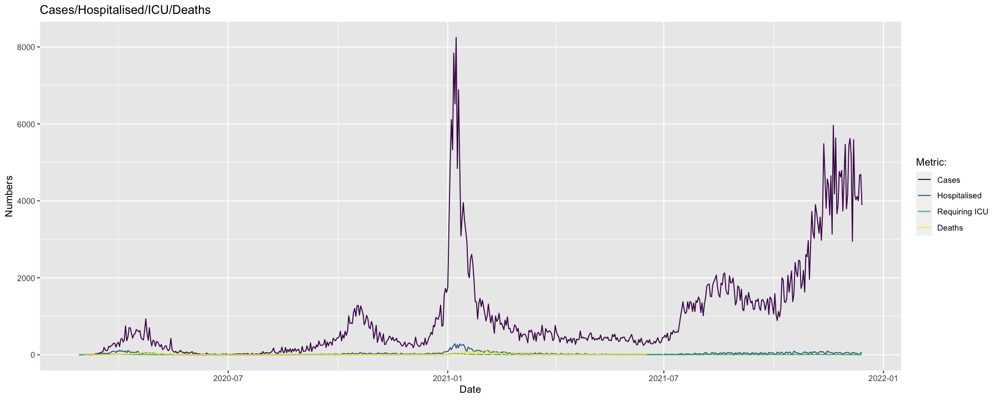

In [58]:
library(ggplot2)

main_metrics %>% ggplot(aes(x = StatisticsProfileDate, y = number, color = metrics, na.rm=TRUE)) + geom_line() + ggtitle("Cases/Hospitalised/ICU/Deaths") + labs(y= "Numbers", x = "Date") + labs(color='Metric:')

We can see, though not quite clearly, that hospitalisations, ICU admissions and deaths are lower in this wave, relative to the number of cases. However, reporting of daily deaths ceases on 17th June, 2021, so in order to compare deaths after this, we will make use of the weekly aggregated data created during data preparation. 

Let's first compare just cases, hospitalisations, and ICU admissions.

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(new_cols)` instead of `new_cols` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.

Warning message:
“Removed 2 row(s) containing missing values (geom_path).”


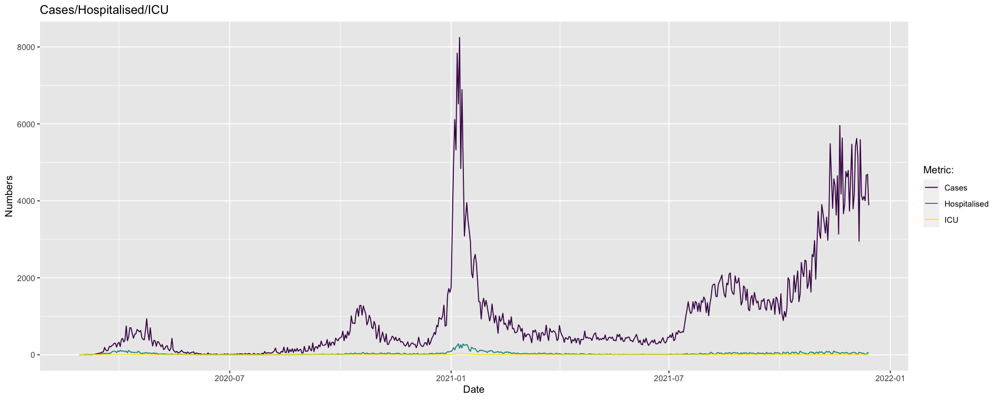

In [59]:
library(dplyr)
library(tidyr)
library(ggplot2)

new_cols <- c('StatisticsProfileDate', 'laggedcases', 'DailyHospitalised', 'DailyICU')
covid_main_metrics <- select(covid, new_cols)
main_metrics <- gather(covid_main_metrics, metrics, number, -StatisticsProfileDate)
main_metrics$metrics <- factor(main_metrics$metrics, order = TRUE, levels = c('laggedcases', 'DailyHospitalised', 'DailyICU'), labels = c('Cases', 'Hospitalised', 'ICU'))
main_metrics %>% ggplot(aes(x = StatisticsProfileDate, y = number, color = metrics)) + geom_line() + ggtitle("Cases/Hospitalised/ICU") + labs(y= "Numbers", x = "Date") + labs(color='Metric:')

We can see that there has been a definite relative decrease in hospitalisations and ICU admissions. 

Finally, we can use aggregate data for weekly total Cases, Hospitalisations, and ICU admissions, in order to compare directly with the number of deaths.

Warning message:
“Removed 4 row(s) containing missing values (geom_path).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”


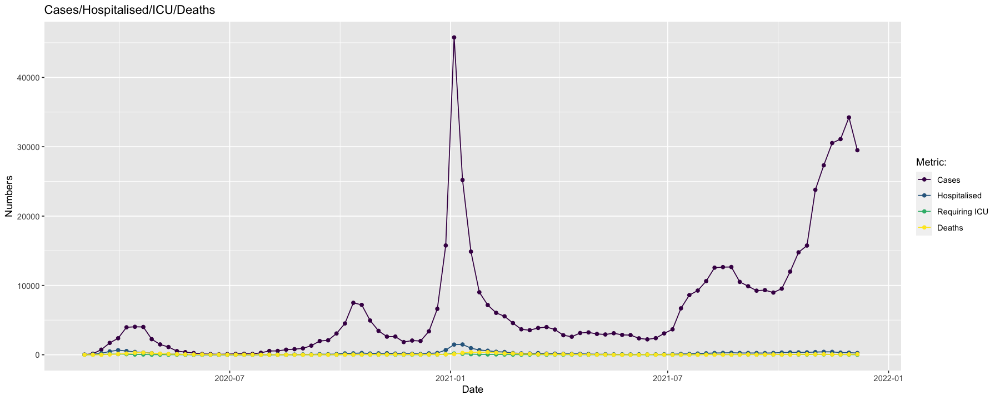

In [60]:
library(dplyr)
library(tidyr)
library(ggplot2)

# Create long table
main_metrics <- gather(joined_df, metrics, number, -lag_week)

# Ensure they're factors
main_metrics$metrics <- factor(main_metrics$metrics, order = TRUE, levels = c('laggedcases', 'DailyHospitalised', 'DailyICU', 'laggeddeaths'), labels = c('Cases', 'Hospitalised', 'Requiring ICU', 'Deaths'))

main_metrics %>% ggplot(aes(x = lag_week, y = number, color = metrics)) + xlim(as.Date("01/03/20", format = "%d/%m/%y"),as.Date("10/12/21", format = "%d/%m/%y")) + geom_line() + geom_point() + ggtitle("Cases/Hospitalised/ICU/Deaths") + labs(y= "Numbers", x = "Date") + labs(color="Metric:")

We can very easily see in this plot that there has been a considerable de-coupling of hospitalisations, ICU admissions, and deaths from cases. We can also see that we have passed a peak in weekly case numbers, which are now falling.

## 10. Excess Deaths from RIP.ie and the CSO <a class="anchor" id="tenth-bullet"></a>

[TOP ↑](#top)

We can include some information taken from *RIP.ie* and the Central Statistics Office (CSO) to provide extra insight into the COVID-19 pandemic, specifically the number of excess deaths during the pandemic compared with pre-pandemic figures. There are three data sets in total: **RIP1** — which details the average weekly deaths from January 2020 to July 2021 according to *RIP.ie*, the higher-grained **RIP2** — which provides the daily number of death notices posted to *RIP.ie* between December 2019 and July 2021, and **RIP3** — which provides the average weekly registered deaths from 2016 to 2019 according to the Central Statistics Office (CSO). 

Once again, the data is taken from [data.gov.ie](https://data.gov.ie/dataset?q=RIP).

### i. RIP1 — Average Weekly RIP Death Notices (Jan 2020 - July 2021)

This data contains the **weekly** number of death notices taken from *RIP.ie* in 2020 and 2021. It has 8 features and 243 records. The grain of this data is *per week*. It has three rows for each week: one for males, one for females, and one for both sexes combined. There are no missing values.

In [61]:
if (!require('readr')) install.packages('readr')
library(readr)
avg_weekly_rip <- readr::read_csv('RIP0117.csv')

Rows: 243 Columns: 8

── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (7): STATISTIC, Statistic, TLIST(W1), Weekly, C02199V02655, Sex, UNIT
dbl (1): VALUE


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



In [62]:
head(avg_weekly_rip)

STATISTIC,Statistic,TLIST(W1),Weekly,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP01C01,Average RIP death notices,2020W01,2020W01,-,Both sexes,Number,709
RIP01C01,Average RIP death notices,2020W01,2020W01,1,Male,Number,333
RIP01C01,Average RIP death notices,2020W01,2020W01,2,Female,Number,377
RIP01C01,Average RIP death notices,2020W02,2020W02,-,Both sexes,Number,740
RIP01C01,Average RIP death notices,2020W02,2020W02,1,Male,Number,383
RIP01C01,Average RIP death notices,2020W02,2020W02,2,Female,Number,376


Let's plot a line and point graph.

In [63]:
# Ensuring the right data type
avg_weekly_rip[[6]] <- as.factor(avg_weekly_rip[[6]])
avg_weekly_rip[[8]] <- as.integer(avg_weekly_rip[[8]])

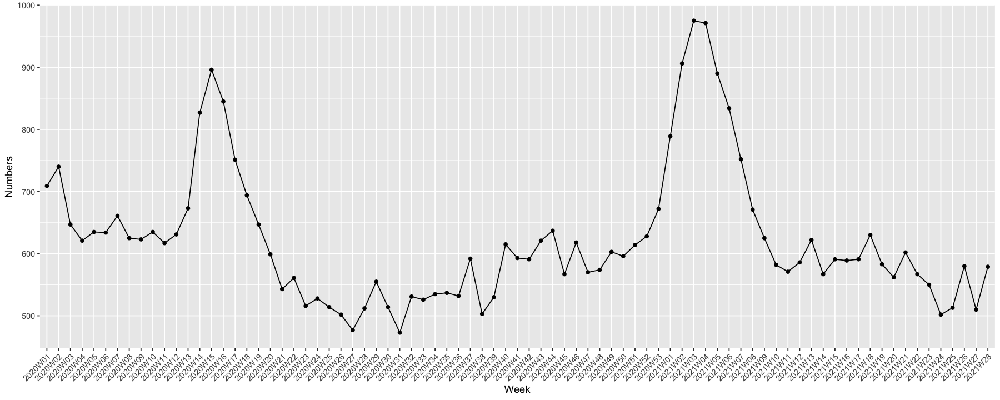

In [64]:
library(dplyr)
library(ggplot2)
# PLot both sexes combined
ggplot(avg_weekly_rip  %>% dplyr::filter(Sex == "Both sexes"), aes(x=Weekly, y=VALUE, group = 1)) + geom_line() + geom_point() + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1))
options(repr.plot.width=15, repr.plot.height=8)

We can also plot men and women separately.

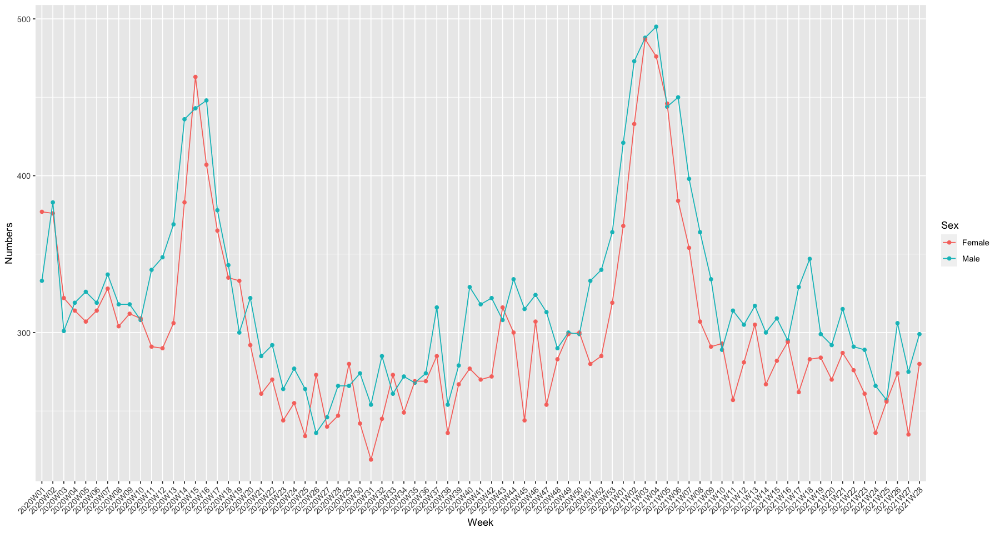

In [65]:
library(dplyr)
library(ggplot2)
ggplot(avg_weekly_rip  %>% dplyr::filter(Sex == "Male" | Sex == "Female"), aes(x=Weekly, y=VALUE, colour=Sex, group=Sex)) + geom_point() + geom_line() + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1))
options(repr.plot.width=15, repr.plot.height=8)

We can do the same using a bar plot.

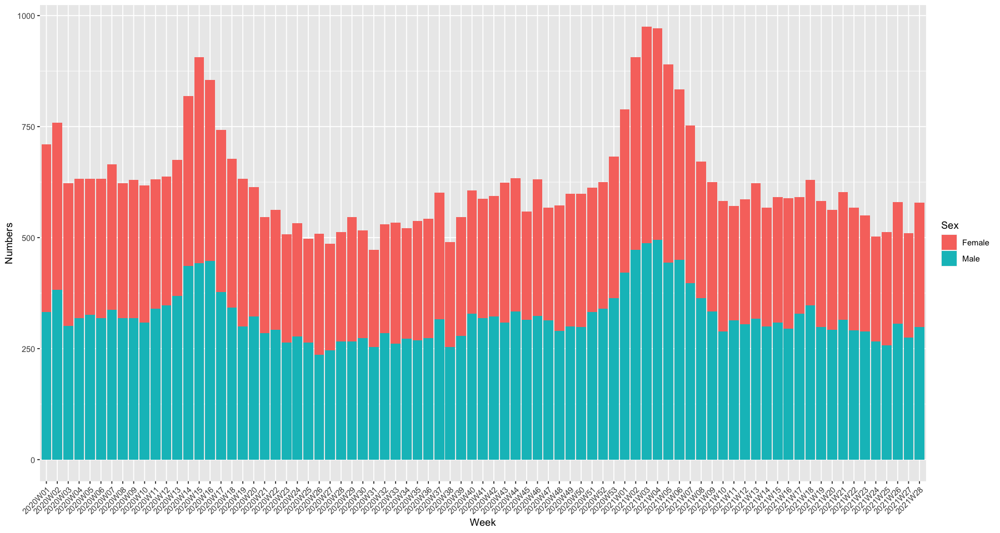

In [66]:
library(dplyr)
library(ggplot2)
ggplot(avg_weekly_rip  %>% dplyr::filter(Sex == "Male" | Sex == "Female"), aes(x=Weekly, y=VALUE, fill=Sex, group=Sex)) + geom_bar(stat="identity") + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1))
options(repr.plot.width=15, repr.plot.height=8)

This data shows clearly the first and third wave. The data does not extend into the current wave.

### ii. RIP2 — Daily RIP Death Notices (Dec 2019 - July 2021)

This data is very similar to RIP1, but contains the **daily** number of death notices taken from *RIP.ie* over a slightly different time frame, between 30th December, 2019, and 18th July, 2021. It has 8 features and 1701 records. The grain of this data is *per day*. It has three rows for each day: one for males, one for females, and one for both sexes combined. There are no missing values.

In [67]:
if (!require('readr')) install.packages('readr')
library(readr)
daily_rip <- readr::read_csv('RIP0217.csv')

Rows: 1701 Columns: 8

── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (7): STATISTIC, Statistic, TLIST(D1), Day, C02199V02655, Sex, UNIT
dbl (1): VALUE


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



In [68]:
head(daily_rip)

STATISTIC,Statistic,TLIST(D1),Day,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP02C01,RIP.ie death notices,2019M12D30,2019 December 30,-,Both sexes,Number,110
RIP02C01,RIP.ie death notices,2019M12D30,2019 December 30,1,Male,Number,38
RIP02C01,RIP.ie death notices,2019M12D30,2019 December 30,2,Female,Number,72
RIP02C01,RIP.ie death notices,2019M12D31,2019 December 31,-,Both sexes,Number,108
RIP02C01,RIP.ie death notices,2019M12D31,2019 December 31,1,Male,Number,54
RIP02C01,RIP.ie death notices,2019M12D31,2019 December 31,2,Female,Number,54


In [69]:
tail(daily_rip)

STATISTIC,Statistic,TLIST(D1),Day,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP02C01,RIP.ie death notices,2021M07D17,2021 July 17,-,Both sexes,Number,100
RIP02C01,RIP.ie death notices,2021M07D17,2021 July 17,1,Male,Number,54
RIP02C01,RIP.ie death notices,2021M07D17,2021 July 17,2,Female,Number,46
RIP02C01,RIP.ie death notices,2021M07D18,2021 July 18,-,Both sexes,Number,98
RIP02C01,RIP.ie death notices,2021M07D18,2021 July 18,1,Male,Number,55
RIP02C01,RIP.ie death notices,2021M07D18,2021 July 18,2,Female,Number,43


We proceed with a basic plot first.

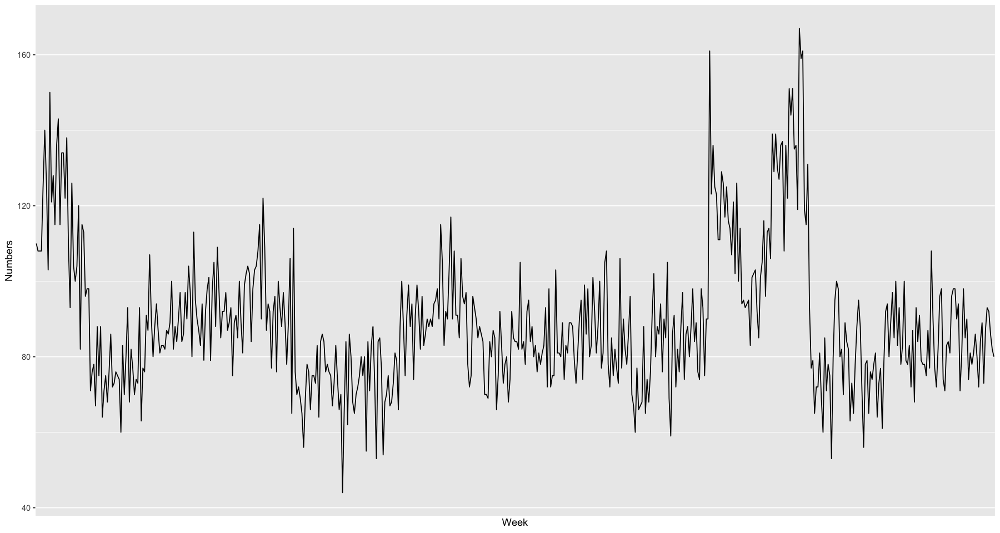

In [70]:
ggplot(daily_rip %>% dplyr::filter(Sex == "Both sexes"), aes(x=Day, y=VALUE, group = 1)) + geom_line() + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + scale_x_discrete(breaks=NULL)
options(repr.plot.width=15, repr.plot.height=8)

Again, we can check for a differential effect between men and women.

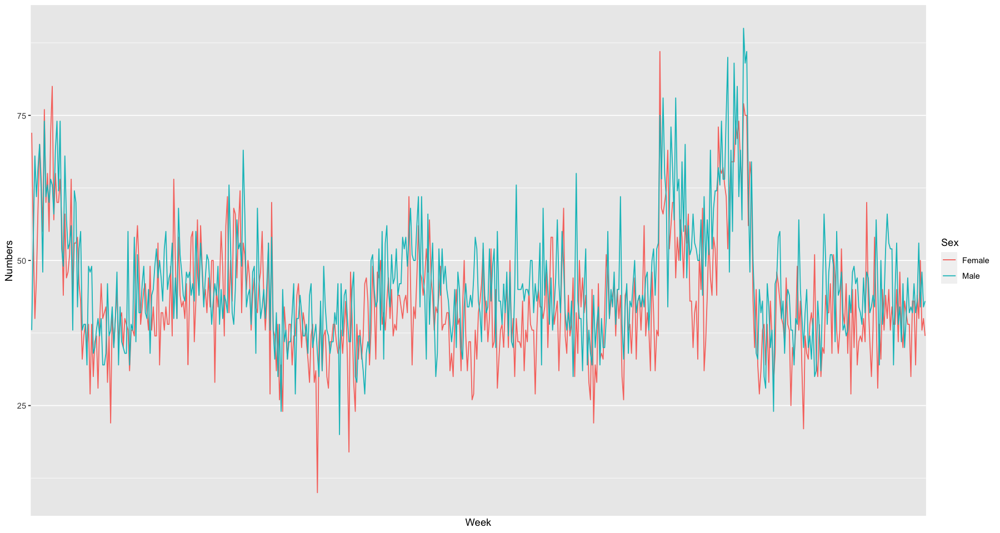

In [71]:
ggplot(daily_rip %>% dplyr::filter(Sex == "Male" | Sex == "Female"), aes(x=Day, y=VALUE, colour=Sex, group=Sex)) + geom_line() + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + scale_x_discrete(breaks=NULL)
options(repr.plot.width=15, repr.plot.height=8)

Again, we can plot a bar graph.

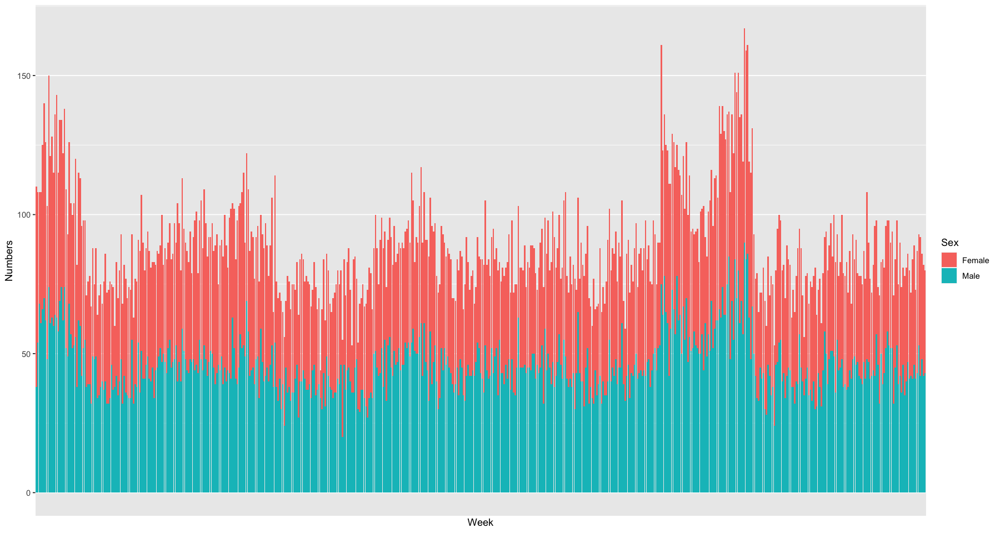

In [72]:
ggplot(daily_rip %>% dplyr::filter(Sex == "Male" | Sex == "Female"), aes(x=Day, y=VALUE, fill=Sex, group=Sex)) + geom_bar(stat="identity") + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + scale_x_discrete(breaks=NULL)
options(repr.plot.width=15, repr.plot.height=8)

Again, the first and third waves are obvious.

### iii. RIP3 — Average Weekly Registered Deaths (2016 - 2019)

This data is very similar to RIP1 and RIP2, but contains the pre-COVID **weekly** number of registered deaths taken from the Central Statistics Office (CSO) averaged over the three years from 2016 to 2019. It has 8 features and 159 records. The grain of this data is *per week*. Once again, it has three rows for each day: one for males, one for females, and one for both sexes combined. There are no missing values.

In [73]:
if (!require('readr')) install.packages('readr')
library(readr)
avg_reg <- readr::read_csv('RIP0317.csv')

Rows: 159 Columns: 8

── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (7): STATISTIC, Statistic, TLIST(W1), Week, C02199V02655, Sex, UNIT
dbl (1): VALUE


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



In [74]:
head(avg_reg)

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 1,-,Both sexes,Number,748
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 1,1,Male,Number,378
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 1,2,Female,Number,370
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 2,-,Both sexes,Number,754
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 2,1,Male,Number,366
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 2,2,Female,Number,388


First, we can plot a line graph.

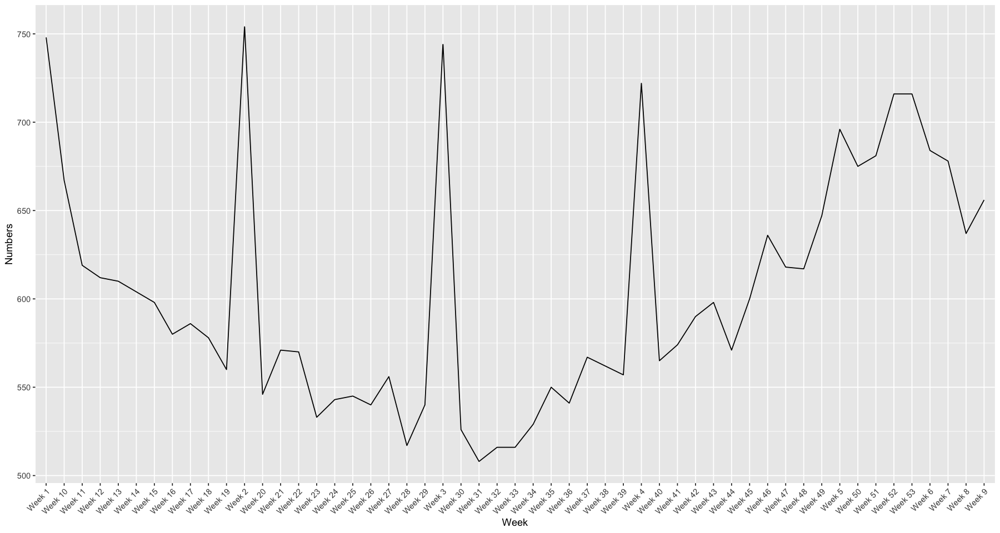

In [75]:
ggplot(avg_reg %>% dplyr::filter(Sex == "Both sexes"), aes(x=Week, y=VALUE, group = 1)) + geom_line() + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1))
options(repr.plot.width=15, repr.plot.height=8)

This is the average weekly deaths throughout the year prior to the pandemic. There is a natural dip during the summer, and deaths increase in the winter. We can view the same data split into men and women.

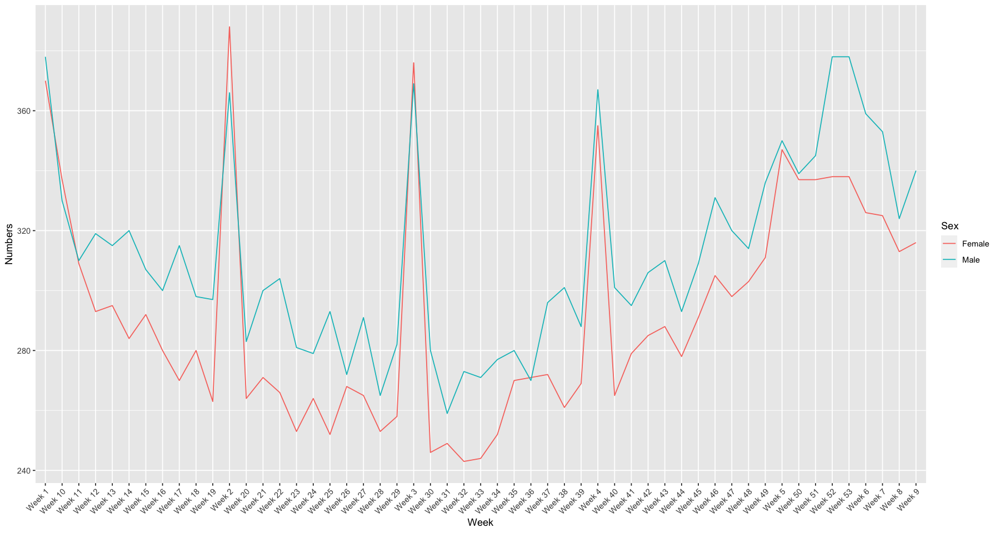

In [76]:
ggplot(avg_reg %>% dplyr::filter(Sex == "Male" | Sex == "Female"), aes(x=Week, y=VALUE, colour=Sex, group=Sex)) + geom_line() + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1))
options(repr.plot.width=15, repr.plot.height=8)

Again, we can plot a bar graph.

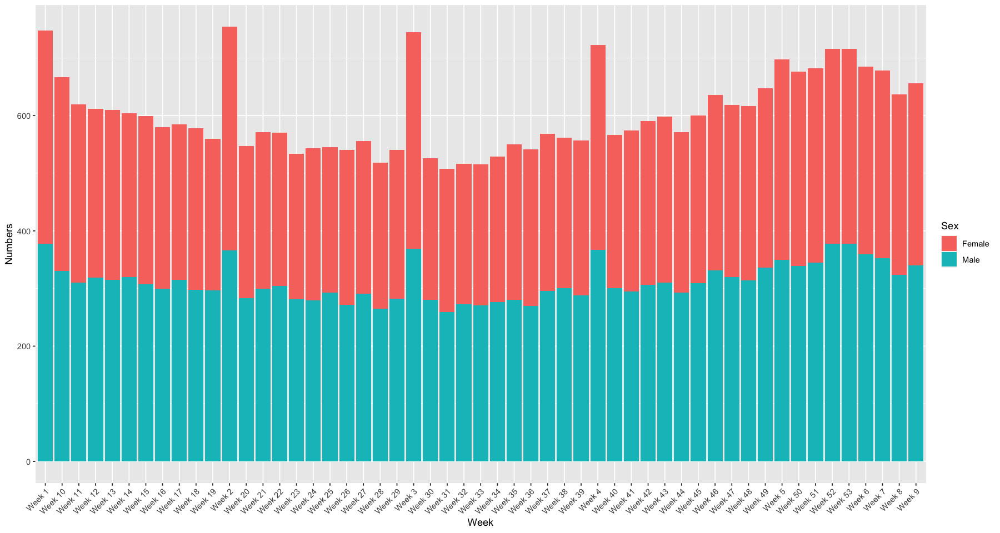

In [77]:
ggplot(avg_reg %>% dplyr::filter(Sex == "Male" | Sex == "Female"), aes(x=Week, y=VALUE, fill=Sex, group=Sex)) + geom_bar(stat="identity") + labs(y= "Numbers", x = "Week") + theme(axis.text.x = element_text(angle=45, hjust = 1))
options(repr.plot.width=15, repr.plot.height=8)

### iv. Comparison of Weekly Deaths Pre- and Post-COVID-19

Let's join together the first and third data sets, RIP1 and RIP3, in order to compare the average weekly deaths between 2016 and 2019, before COVID-19, with the weekly deaths in 2020 and 2021, after the beginning of the pandemic.

#### a) Weekly Deaths in 2020

First, we need to filter the data to include only the weeks from 2020.

In [78]:
avg_weekly_rip_2020 <- avg_weekly_rip[1:159,]
head(avg_weekly_rip_2020)
tail(avg_weekly_rip_2020)

STATISTIC,Statistic,TLIST(W1),Weekly,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2020W01,2020W01,-,Both sexes,Number,709
RIP01C01,Average RIP death notices,2020W01,2020W01,1,Male,Number,333
RIP01C01,Average RIP death notices,2020W01,2020W01,2,Female,Number,377
RIP01C01,Average RIP death notices,2020W02,2020W02,-,Both sexes,Number,740
RIP01C01,Average RIP death notices,2020W02,2020W02,1,Male,Number,383
RIP01C01,Average RIP death notices,2020W02,2020W02,2,Female,Number,376


STATISTIC,Statistic,TLIST(W1),Weekly,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2020W52,2020W52,-,Both sexes,Number,628
RIP01C01,Average RIP death notices,2020W52,2020W52,1,Male,Number,340
RIP01C01,Average RIP death notices,2020W52,2020W52,2,Female,Number,285
RIP01C01,Average RIP death notices,2020W53,2020W53,-,Both sexes,Number,672
RIP01C01,Average RIP death notices,2020W53,2020W53,1,Male,Number,364
RIP01C01,Average RIP death notices,2020W53,2020W53,2,Female,Number,319


First, we need to make sure that the columns are all compatible and that the time components are in the same format. We'll begin by changing the name of the time column in the RIP1 data from "Weekly" to "Week" — in line with the data in RIP3.

In [79]:
colnames(avg_weekly_rip_2020)[which(names(avg_weekly_rip_2020) == "Weekly")] <- "Week"
head(avg_weekly_rip_2020)

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2020W01,2020W01,-,Both sexes,Number,709
RIP01C01,Average RIP death notices,2020W01,2020W01,1,Male,Number,333
RIP01C01,Average RIP death notices,2020W01,2020W01,2,Female,Number,377
RIP01C01,Average RIP death notices,2020W02,2020W02,-,Both sexes,Number,740
RIP01C01,Average RIP death notices,2020W02,2020W02,1,Male,Number,383
RIP01C01,Average RIP death notices,2020W02,2020W02,2,Female,Number,376


Next, we need to change the naming of the individual weeks in the newly re-named "Week" column inside RIP1 from, for example, "2020W01" to "Week 1", and so on, in order to match with the same week in RIP3.

In [80]:
avg_weekly_rip_2020$Week <- gsub('2020W','Week ', avg_weekly_rip_2020$Week)

We can check that this process has succeeded.

In [81]:
nrow(avg_weekly_rip_2020)
head(avg_weekly_rip_2020)

[1] 159

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2020W01,Week 01,-,Both sexes,Number,709
RIP01C01,Average RIP death notices,2020W01,Week 01,1,Male,Number,333
RIP01C01,Average RIP death notices,2020W01,Week 01,2,Female,Number,377
RIP01C01,Average RIP death notices,2020W02,Week 02,-,Both sexes,Number,740
RIP01C01,Average RIP death notices,2020W02,Week 02,1,Male,Number,383
RIP01C01,Average RIP death notices,2020W02,Week 02,2,Female,Number,376


In [82]:
nrow(avg_reg)
head(avg_reg)

[1] 159

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 1,-,Both sexes,Number,748
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 1,1,Male,Number,378
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 1,2,Female,Number,370
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 2,-,Both sexes,Number,754
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 2,1,Male,Number,366
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 2,2,Female,Number,388


There's one remaining issue. The single-digit weeks still differ between RIP1 and RIP3 by an additional 0. This must be fixed. The simplest way forward is to add a 0 to the single-digit weeks in RIP3 using the *gsub()* function, taking care not to mistakenly alter the double-digit weeks.

In [83]:
avg_reg$Week <- gsub('\\<Week 1\\>','Week 01', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 2\\>','Week 02', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 3\\>','Week 03', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 4\\>','Week 04', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 5\\>','Week 05', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 6\\>','Week 06', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 7\\>','Week 07', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 8\\>','Week 08', avg_reg$Week)
avg_reg$Week <- gsub('\\<Week 9\\>','Week 09', avg_reg$Week)

In [84]:
nrow(avg_reg)
head(avg_reg)

[1] 159

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 01,-,Both sexes,Number,748
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 01,1,Male,Number,378
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,Week 01,2,Female,Number,370
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 02,-,Both sexes,Number,754
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 02,1,Male,Number,366
RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W02,Week 02,2,Female,Number,388


We are now in a position to join the two data sets together, which we must do by both Week and Sex, as there are three rows for every week, for males, females, and a combined total. We can do so using dplyr's *left_join()* function.

In [85]:
library(dplyr)
combined <- dplyr::left_join(avg_weekly_rip_2020, avg_reg, by = c("Week", "Sex"))
nrow(combined)

[1] 159

FInally, we can plot the average weekly deaths during the COVID-19 pandemic, as recorded by *RIP.ie*, and compare this directly to the average weekly deaths from pre-COVID-19 — the combined weekly average between 2016 and 2019.

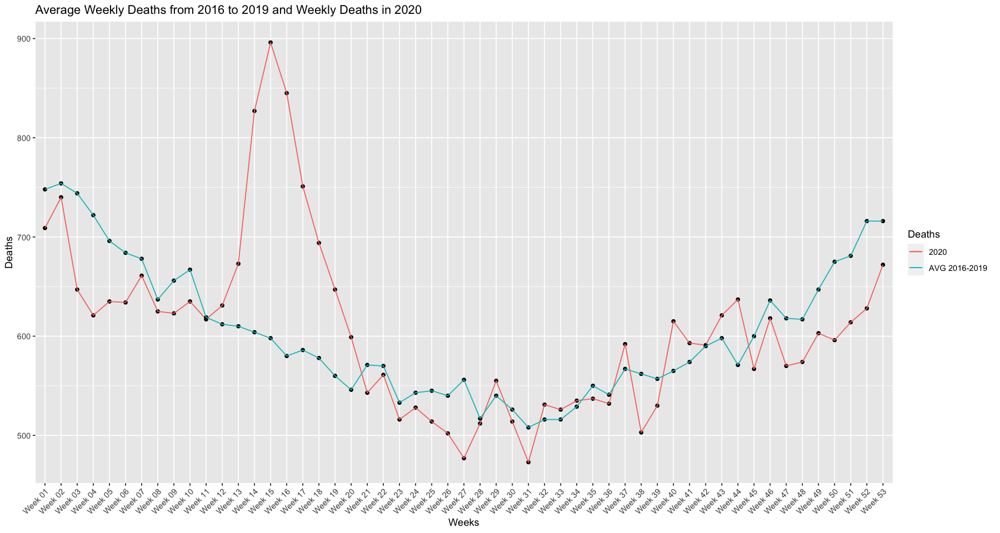

In [86]:
options(repr.plot.width=15, repr.plot.height=8)
deaths2020 <- ggplot(combined %>% dplyr::filter(Sex == "Both sexes"), aes(x=Week, group = 1)) + geom_point(aes(y=VALUE.x)) + geom_line(aes(y=VALUE.x, color="2020")) + geom_point(aes(y=VALUE.y)) + geom_line(aes(y=VALUE.y, color="AVG 2016-2019")) + ggtitle("Average Weekly Deaths from 2016 to 2019 and Weekly Deaths in 2020") + labs(y= "Deaths", x = "Weeks") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + labs(color="Deaths")
deaths2020

We can see that there was a huge surge in deaths during the first wave in 2020. These are excess, above normal expectation.

#### Weekly Deaths in 2021

We can do the same process for 2021.

In [87]:
len <- 159 + (nrow(avg_weekly_rip) - nrow(avg_weekly_rip_2020))
avg_weekly_rip_2021 <- avg_weekly_rip[160:len,]
nrow(avg_weekly_rip_2021)
head(avg_weekly_rip_2021)
tail(avg_weekly_rip_2021)

[1] 84

STATISTIC,Statistic,TLIST(W1),Weekly,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2021W01,2021W01,-,Both sexes,Number,789
RIP01C01,Average RIP death notices,2021W01,2021W01,1,Male,Number,421
RIP01C01,Average RIP death notices,2021W01,2021W01,2,Female,Number,368
RIP01C01,Average RIP death notices,2021W02,2021W02,-,Both sexes,Number,906
RIP01C01,Average RIP death notices,2021W02,2021W02,1,Male,Number,473
RIP01C01,Average RIP death notices,2021W02,2021W02,2,Female,Number,433


STATISTIC,Statistic,TLIST(W1),Weekly,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2021W27,2021W27,-,Both sexes,Number,510
RIP01C01,Average RIP death notices,2021W27,2021W27,1,Male,Number,275
RIP01C01,Average RIP death notices,2021W27,2021W27,2,Female,Number,235
RIP01C01,Average RIP death notices,2021W28,2021W28,-,Both sexes,Number,579
RIP01C01,Average RIP death notices,2021W28,2021W28,1,Male,Number,299
RIP01C01,Average RIP death notices,2021W28,2021W28,2,Female,Number,280


In [88]:
colnames(avg_weekly_rip_2021)[which(names(avg_weekly_rip_2021) == "Weekly")] <- "Week"
head(avg_weekly_rip_2021)

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2021W01,2021W01,-,Both sexes,Number,789
RIP01C01,Average RIP death notices,2021W01,2021W01,1,Male,Number,421
RIP01C01,Average RIP death notices,2021W01,2021W01,2,Female,Number,368
RIP01C01,Average RIP death notices,2021W02,2021W02,-,Both sexes,Number,906
RIP01C01,Average RIP death notices,2021W02,2021W02,1,Male,Number,473
RIP01C01,Average RIP death notices,2021W02,2021W02,2,Female,Number,433


In [89]:
avg_weekly_rip_2021$Week <- gsub('2021W','Week ', avg_weekly_rip_2021$Week)
head(avg_weekly_rip_2021)

STATISTIC,Statistic,TLIST(W1),Week,C02199V02655,Sex,UNIT,VALUE
<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<int>
RIP01C01,Average RIP death notices,2021W01,Week 01,-,Both sexes,Number,789
RIP01C01,Average RIP death notices,2021W01,Week 01,1,Male,Number,421
RIP01C01,Average RIP death notices,2021W01,Week 01,2,Female,Number,368
RIP01C01,Average RIP death notices,2021W02,Week 02,-,Both sexes,Number,906
RIP01C01,Average RIP death notices,2021W02,Week 02,1,Male,Number,473
RIP01C01,Average RIP death notices,2021W02,Week 02,2,Female,Number,433


In [90]:
library(dplyr)
combined2 <- dplyr::left_join(avg_weekly_rip_2021, avg_reg, by = c("Week", "Sex"))
nrow(combined2)
head(combined2, 2)

[1] 84

STATISTIC.x,Statistic.x,TLIST(W1).x,Week,C02199V02655.x,Sex,UNIT.x,VALUE.x,STATISTIC.y,Statistic.y,TLIST(W1).y,C02199V02655.y,UNIT.y,VALUE.y
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
RIP01C01,Average RIP death notices,2021W01,Week 01,-,Both sexes,Number,789,RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,-,Number,748
RIP01C01,Average RIP death notices,2021W01,Week 01,1,Male,Number,421,RIP03C01,Average Number of Registered Weekly Deaths 2016-2019,W01,1,Number,378


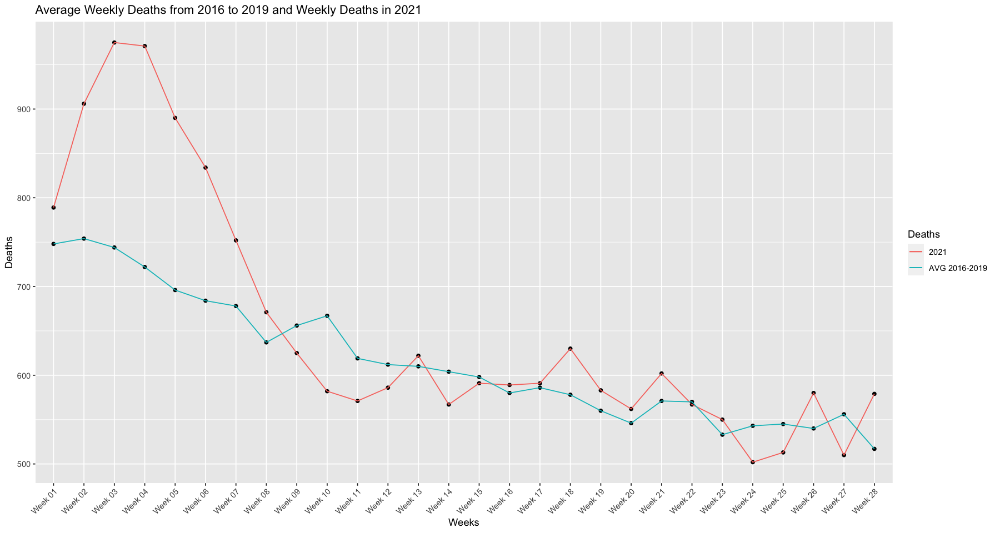

In [91]:
options(repr.plot.width=15, repr.plot.height=8)
deaths2021 <- ggplot(combined2 %>% dplyr::filter(Sex == "Both sexes"), aes(x=Week, group = 1)) + geom_point(aes(y=VALUE.x)) + geom_line(aes(y=VALUE.x, color="2021")) + geom_point(aes(y=VALUE.y)) + geom_line(aes(y=VALUE.y, color="AVG 2016-2019")) + ggtitle("Average Weekly Deaths from 2016 to 2019 and Weekly Deaths in 2021") + labs(y= "Deaths", x = "Weeks") + theme(axis.text.x = element_text(angle=45, hjust = 1)) + labs(color="Deaths")
deaths2021

We can see, once again, excess deaths in the third wave at the start of this year. However, deaths have returned to "normal" expectation in recent months. The data does not extend to the present day. Finally, we can plot these graphs side-by-side for ease of comparison.

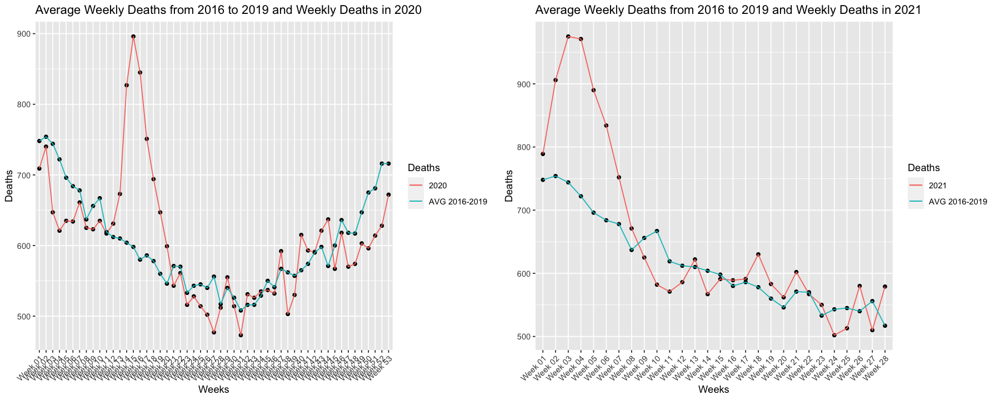

In [92]:
options(repr.plot.width=15, repr.plot.height=6)
require(gridExtra)
grid.arrange(deaths2020, deaths2021, ncol=2)

## Conclusion <a class="anchor" id="eleventh-bullet"></a>

[TOP ↑](#top)

* The four waves of the pandemic are obvious in plots of case numbers, with suppression of hospitalisations and ICU admissions in recent months relative to previous waves. This is likely due to the vaccination rollout.
* The median age of those with COVID-19 has decreased. The age profile of cases has shifted from older cohorts to younger. 
* The number of deaths have also been suppressed compared to previous waves.
* The age profile of cases and hospitalisations are mirror images, cases higher among younger cohorts, hospitalisations higher among the older cohorts, as we'd expect.
* Excess deaths in the first and third waves are obvious from death notices placed on RIP.ie. Recent deaths have returned to "normal" expectation. Data is not available for the most recent wave, however.
* Recent Trends:
    * Cases: Numbers have levelled off and are beginning to fall.
    * Deaths: Numbers have also stabilised.
    * Hospitalisations: These have fallen in the last weeks.
    * ICU Admissions: These have dramatically fallen.
    * Cases among Healthcare Workers: There has been a significant drop.
* Omicron Variant: No evidence yet for its impact.